## Set up the working environment

In [1]:
#Setup the working environment
setwd("/hpc/group/pbenfeylab/mz187/")

In [2]:
# Load the packages
suppressMessages(library(Seurat))
suppressMessages(library(SeuratWrappers))
suppressMessages(library(monocle3)) 

## Load the integrated rice root reference Atlas

In [3]:
# Read rice root atlast Copilot project
rc.integrated <- readRDS("Rice_12S_WT_atlas_20221117_seu3.rds")


Stem Cell Niche    Sclerenchyma        Root Cap    Atrichoblast     Trichoblast 
           7746            8493            4724            4675            5401 
         Cortex      Endodermis          Phloem       Pericycle       Exodermis 
          17257            4362            2455            5088           10326 
     Protoxylem       Metaxylem 
           7928            1288 

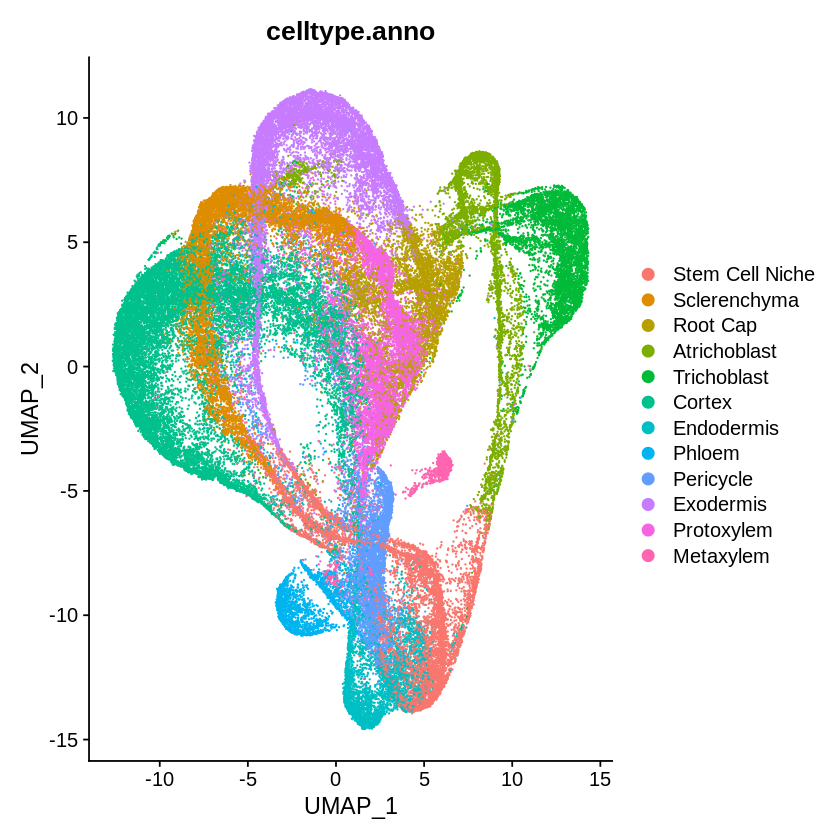

In [4]:
# Show the UMAP and cell number for each cell type cluster
DimPlot(rc.integrated, reduction = "umap",group.by = "celltype.anno")
table(rc.integrated$celltype.anno)

## Subgroup the epidermal cells

In [5]:
# Define meristem, trichoblast and atrichoblast together for epidermis developmental trajectory analysis
rc.integrated$epidermis <- rc.integrated$celltype.anno %in% c("Stem Cell Niche","Atrichoblast","Trichoblast")

table(rc.integrated$epidermis)

table(rc.integrated$celltype.anno)

rc.integrated$epidermis <- as.character(rc.integrated$epidermis)

rc.integrated$epidermis <- gsub("TRUE", "Epidermal", rc.integrated$epidermis,
                               ignore.case = FALSE, perl = FALSE,
                               fixed = T, useBytes = FALSE)

rc.integrated$epidermis <- gsub("FALSE", "Others", rc.integrated$epidermis,
                               ignore.case = FALSE, perl = FALSE,
                               fixed = T, useBytes = FALSE)

rc.integrated$epidermis <- factor(rc.integrated$epidermis , 
                                 levels=c("Epidermal", "Others"))

table(rc.integrated$epidermis, rc.integrated$celltype.anno)

# Get cell number included in each group
table(rc.integrated$epidermis)


FALSE  TRUE 
61921 17822 


Stem Cell Niche    Sclerenchyma        Root Cap    Atrichoblast     Trichoblast 
           7746            8493            4724            4675            5401 
         Cortex      Endodermis          Phloem       Pericycle       Exodermis 
          17257            4362            2455            5088           10326 
     Protoxylem       Metaxylem 
           7928            1288 

           
            Stem Cell Niche Sclerenchyma Root Cap Atrichoblast Trichoblast
  Epidermal            7746            0        0         4675        5401
  Others                  0         8493     4724            0           0
           
            Cortex Endodermis Phloem Pericycle Exodermis Protoxylem Metaxylem
  Epidermal      0          0      0         0         0          0         0
  Others     17257       4362   2455      5088     10326       7928      1288


Epidermal    Others 
    17822     61921 

In [6]:
## Subgroup the normal group for correlation analysis
rc.epidermis <- subset(rc.integrated, cells=colnames(rc.integrated)[which(rc.integrated$epidermis=="Epidermal")])

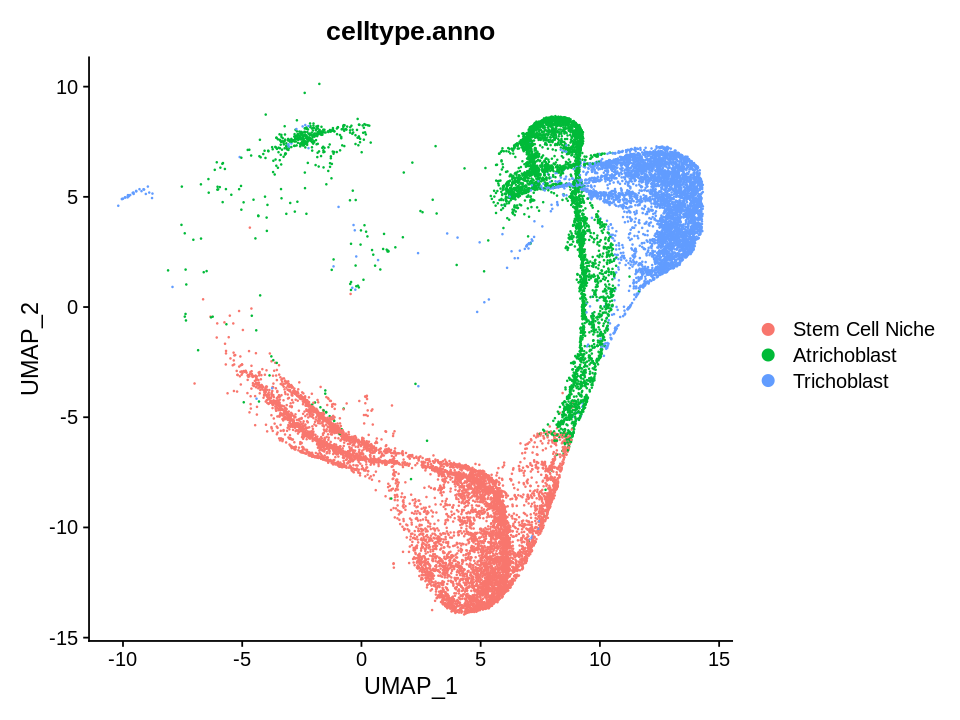

In [7]:
# Check the epidermis UMAP
options(repr.plot.width=8, repr.plot.height=6)
DimPlot(rc.epidermis, reduction = "umap",group.by = "celltype.anno")

## Further select the meristem cells relevatnt to Epidermal cell differentiation

In [8]:
# Rerun UMAP to make the clusters simpler
rc.epidermis <- RunUMAP(rc.epidermis, reduction = "pca", dims = 1:3)
rc.epidermis <- FindNeighbors(rc.epidermis, reduction = "pca", dims = 1:3)
rc.epidermis <- FindClusters(rc.epidermis, resolution = 0.5)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
16:01:05 UMAP embedding parameters a = 0.9922 b = 1.112

16:01:05 Read 17822 rows and found 3 numeric columns

16:01:06 Using Annoy for neighbor search, n_neighbors = 30

16:01:06 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:01:08 Writing NN index file to temp file /tmp/RtmpjuEspD/file20a4e066125b16

16:01:08 Searching Annoy index using 1 thread, search_k = 3000

16:01:16 Annoy recall = 100%

16:01:17 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 17822
Number of edges: 461212

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9335
Number of communities: 18
Elapsed time: 1 seconds



   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2004 1544 1427 1136 1112 1081 1046 1033 1032 1013  946  919  894  598  575  567 
  16   17 
 530  365 

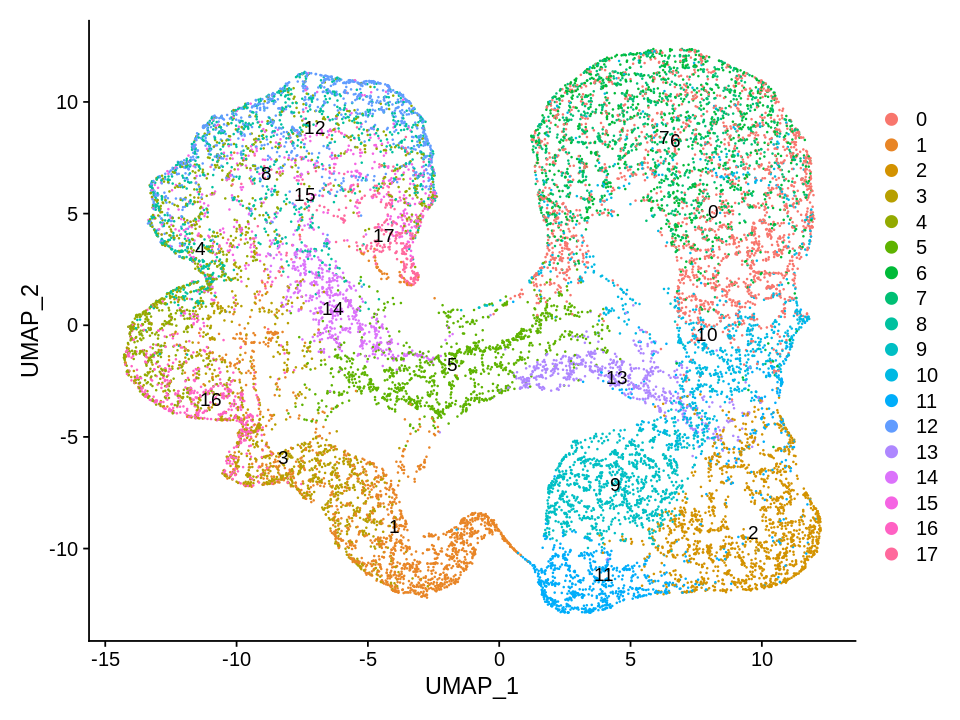

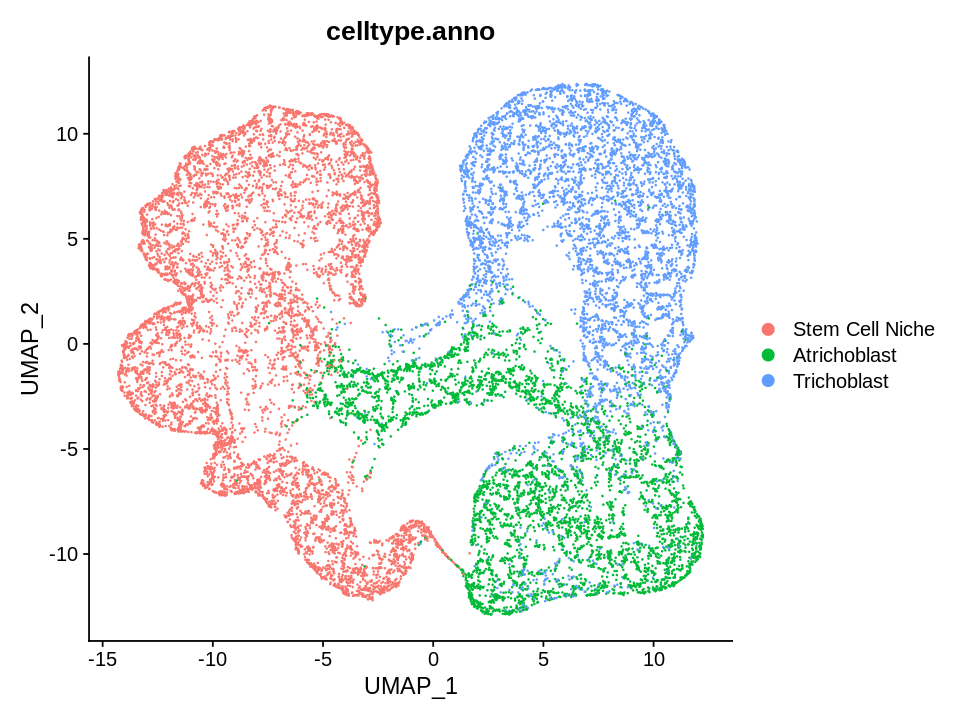

In [9]:
# Use Dimplot to check the clustering result
DimPlot(rc.epidermis, reduction = "umap",label = TRUE)
table(rc.epidermis$seurat_clusters)
DimPlot(rc.epidermis, reduction = "umap",group.by = "celltype.anno")

In [10]:
# Remove the "stem cell niche" cells which seems not relevant to epidermis
rc.epidermis$use <- rc.epidermis$seurat_clusters %in% c("1","3","4","8","12","15","17")

table(rc.epidermis$use)

table(rc.epidermis$seurat_clusters)

rc.epidermis$use <- as.character(rc.epidermis$use)

rc.epidermis$use <- gsub("TRUE", "nonuse", rc.epidermis$use,
                         ignore.case = FALSE, perl = FALSE,
                         fixed = T, useBytes = FALSE)

rc.epidermis$use <- gsub("FALSE", "inuse", rc.epidermis$use,
                         ignore.case = FALSE, perl = FALSE,
                         fixed = T, useBytes = FALSE)

rc.epidermis$use <- factor(rc.epidermis$use, 
                           levels=c("inuse", "nonuse"))

table(rc.epidermis$use, rc.epidermis$seurat_clusters)


FALSE  TRUE 
11172  6650 


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2004 1544 1427 1136 1112 1081 1046 1033 1032 1013  946  919  894  598  575  567 
  16   17 
 530  365 

        
            0    1    2    3    4    5    6    7    8    9   10   11   12   13
  inuse  2004    0 1427    0    0 1081 1046 1033    0 1013  946  919    0  598
  nonuse    0 1544    0 1136 1112    0    0    0 1032    0    0    0  894    0
        
           14   15   16   17
  inuse   575    0  530    0
  nonuse    0  567    0  365

In [11]:
## Subgroup the wanted stem cell nich, atrichoblast, trichoblast cells for monocle analysis
sub.epidermis <- subset(rc.epidermis, cells=colnames(rc.epidermis)[which(rc.epidermis$use=="inuse")])

16:02:53 UMAP embedding parameters a = 0.9922 b = 1.112

16:02:53 Read 11172 rows and found 7 numeric columns

16:02:53 Using Annoy for neighbor search, n_neighbors = 30

16:02:53 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:02:54 Writing NN index file to temp file /tmp/RtmpjuEspD/file20a4e03a9f2840

16:02:54 Searching Annoy index using 1 thread, search_k = 3000

16:02:58 Annoy recall = 100%

16:02:59 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:03:02 Initializing from normalized Laplacian + noise (using irlba)

16:03:02 Commencing optimization for 200 epochs, with 425024 positive edges

16:03:08 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11172
Number of edges: 318177

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9623
Number of communities: 6
Elapsed time: 1 seconds


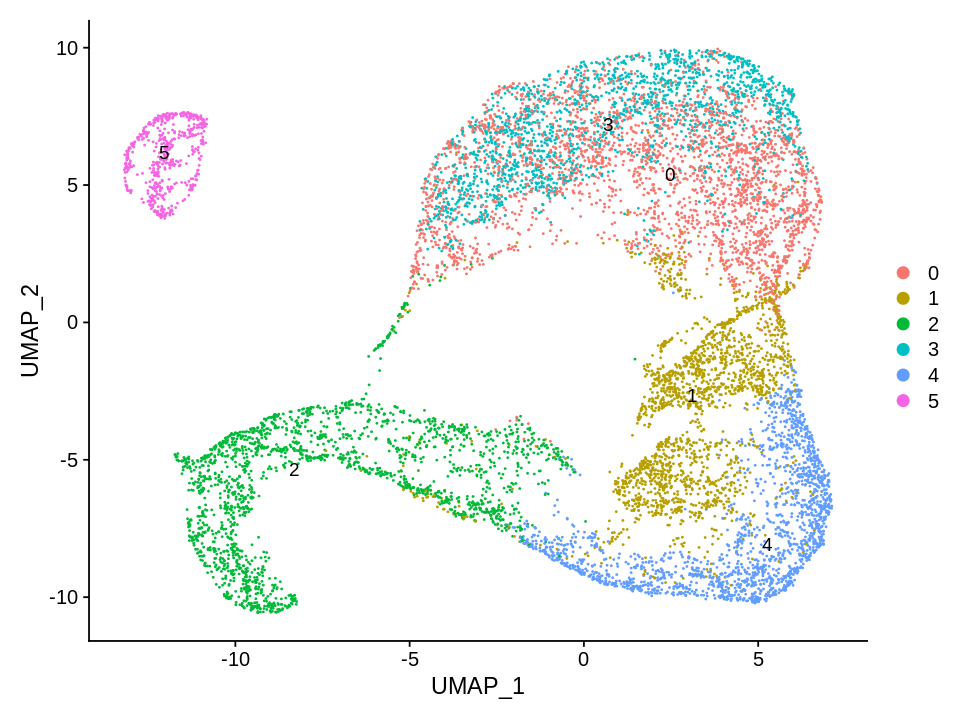

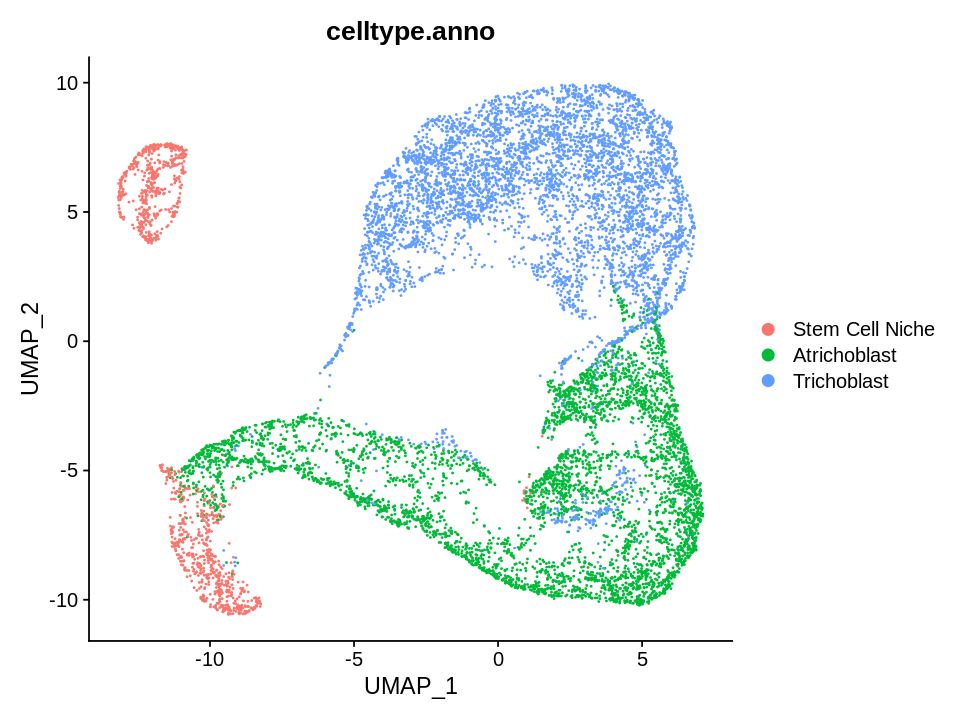

In [12]:
# Rerun UMAP to make the clusters simpler
sub.epidermis <- RunUMAP(sub.epidermis, reduction = "pca", dims = 1:7)
sub.epidermis <- FindNeighbors(sub.epidermis, reduction = "pca", dims = 1:7)
sub.epidermis <- FindClusters(sub.epidermis, resolution = 0.1)
# Use Dimplot to check the clustering result
DimPlot(sub.epidermis, reduction = "umap",label = TRUE)
DimPlot(sub.epidermis, reduction = "umap",group.by = "celltype.anno")

In [ ]:
# There is still a separated Stem Cell Niche cluster, far from the epidermal cell lineages. Will do another subgroup to exclude them.

In [13]:
# Remove more "stem cell niche" cells which seems not relevant to epidermis
sub.epidermis$filter <- sub.epidermis$seurat_clusters %in% c("5")

table(sub.epidermis$filter)

table(sub.epidermis$seurat_clusters)

sub.epidermis$filter <- as.character(sub.epidermis$filter)

sub.epidermis$filter <- gsub("TRUE", "exclude", sub.epidermis$filter,
                         ignore.case = FALSE, perl = FALSE,
                         fixed = T, useBytes = FALSE)

sub.epidermis$filter <- gsub("FALSE", "include", sub.epidermis$filter,
                         ignore.case = FALSE, perl = FALSE,
                         fixed = T, useBytes = FALSE)

sub.epidermis$filter <- factor(sub.epidermis$filter, 
                           levels=c("include", "exclude"))

table(sub.epidermis$filter, sub.epidermis$seurat_clusters)


FALSE  TRUE 
10642   530 


   0    1    2    3    4    5 
2927 2015 1995 1867 1838  530 

         
             0    1    2    3    4    5
  include 2927 2015 1995 1867 1838    0
  exclude    0    0    0    0    0  530

In [14]:
## Further subgroup the wanted stem cell nich, atrichoblast, trichoblast cells for monocle analysis
sub.epidermis2 <- subset(sub.epidermis, cells=colnames(sub.epidermis)[which(sub.epidermis$filter=="include")])

In [4]:
# Read rice root subgrouped Copilot project
sub.epidermis2 <- readRDS("./1-Root_Atlas/sub.epidermis.rds")

In [24]:
# Re-run PCA for the data subet
sub.epidermis2 <- RunPCA(sub.epidermis2, npcs = 50, verbose = FALSE, approx = TRUE)

14:15:24 UMAP embedding parameters a = 0.7669 b = 1.223

14:15:24 Read 10642 rows and found 7 numeric columns

14:15:24 Using Annoy for neighbor search, n_neighbors = 50

14:15:24 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:15:26 Writing NN index file to temp file /tmp/RtmpHIVa7I/file2f10485810e279

14:15:26 Searching Annoy index using 1 thread, search_k = 5000

14:15:33 Annoy recall = 100%

14:15:34 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 50

14:15:36 Initializing from normalized Laplacian + noise (using irlba)

14:15:37 Commencing optimization for 200 epochs, with 647838 positive edges

14:15:44 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 10642
Number of edges: 315339

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9164
Number of communities: 15
Elapsed time: 2 seconds


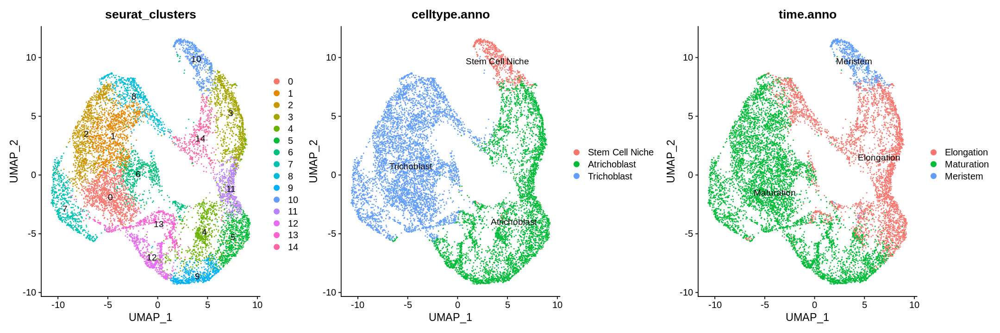

In [26]:
# Rerun UMAP to make the clusters simpler
sub.epidermis2 <- RunUMAP(sub.epidermis2, reduction = "pca",n.neighbors = 50L, min.dist = 0.4, dims = 1:7)
sub.epidermis2 <- FindNeighbors(sub.epidermis2, reduction = "pca", dims = 1:7)
sub.epidermis2 <- FindClusters(sub.epidermis2, resolution = 0.5)
# Use Dimplot to check the clustering result
options(repr.plot.width=18, repr.plot.height=6)
DimPlot(sub.epidermis2, reduction = "umap",label = TRUE,group.by = c("seurat_clusters","celltype.anno","time.anno"), ncol = 3)

In [27]:
# Save the rds object the PCA calculated
saveRDS(sub.epidermis2, file = "./1-Root_Atlas/sub.epidermis-2.rds")

## Redefine the cell developmental stages and cell type for later trajectory analysis

In [4]:
# Read rice root subgrouped Copilot project
sub.epidermis2 <- readRDS("./1-Root_Atlas/sub.epidermis-2.rds")

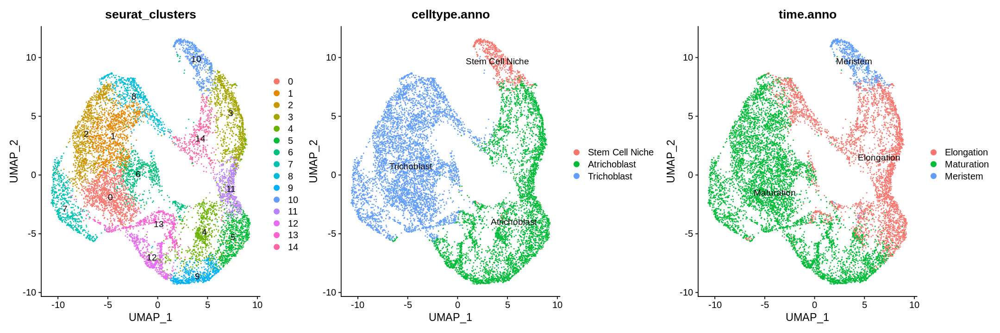

In [5]:
# Use Dimplot to check the clustering result
options(repr.plot.width=18, repr.plot.height=6)
DimPlot(sub.epidermis2, reduction = "umap",label = TRUE,group.by = c("seurat_clusters","celltype.anno","time.anno"), ncol = 3)

In [6]:
## Manually assign the clusters to different cell groups with cell type and developmental stage ananotation
sub.epidermis2$defined_clusters <- rep("Maturation Trichoblast", ncol(sub.epidermis2))
sub.epidermis2$defined_clusters[which((sub.epidermis2$seurat_clusters==10))] = "Meristem Epidermis"
sub.epidermis2$defined_clusters[which(sub.epidermis2$seurat_clusters==3)] = "Elongation Epidermis"
sub.epidermis2$defined_clusters[which((sub.epidermis2$seurat_clusters==11)|(sub.epidermis2$seurat_clusters==4)|(sub.epidermis2$seurat_clusters==5))] = "Elongation Atrichoblast"
sub.epidermis2$defined_clusters[which((sub.epidermis2$seurat_clusters==14)|(sub.epidermis2$seurat_clusters==8))] = "Elongation Trichoblast"
sub.epidermis2$defined_clusters[which((sub.epidermis2$seurat_clusters==9)|(sub.epidermis2$seurat_clusters==12)|(sub.epidermis2$seurat_clusters==13))] = "Maturation Atrichoblast"


Elongation Atrichoblast    Elongation Epidermis  Elongation Trichoblast 
                   2084                     890                    1020 
Maturation Atrichoblast  Maturation Trichoblast      Meristem Epidermis 
                   1547                    4562                     539 

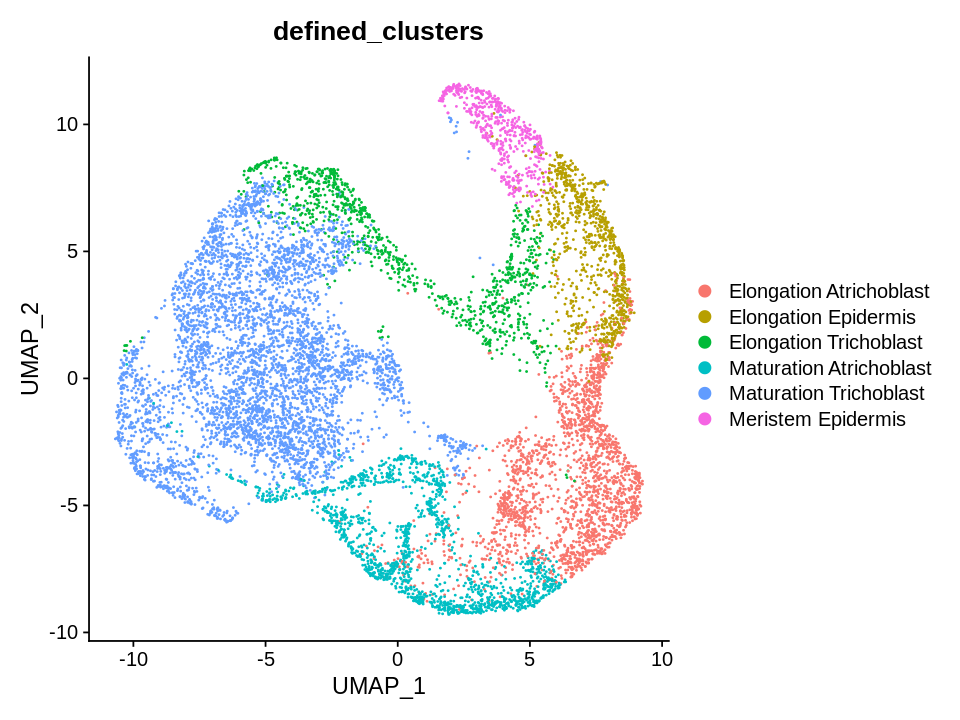

In [7]:
# Check whether the assigning works
table(sub.epidermis2$defined_clusters)
options(repr.plot.width=8, repr.plot.height=6)
DimPlot(sub.epidermis2, reduction = "umap",group.by = "defined_clusters")

## Use Monocle3 to investigate the pesuodotime developmental trajectory 

In [3]:
# Define the "toMonocle3" function, code by Che-Wei Hsu
ToMonocle3 <- function(seurat_object,
                       scale_all = FALSE,
                       assay = "SCT",
                       reduction_for_projection = "PCA",
                       UMAP_cluster_slot = NULL){
  if(scale_all){
    message("Getting residuals for all Seurat genes in chosen assay slot and placing in scale.data")
    seurat_genes <- rownames(seurat_object[[assay]])
    remaining_genes <- setdiff(seurat_genes, rownames(seurat_object[[assay]]@scale.data))
    if(assay == "SCT"){
      seurat_object <- Seurat::GetResidual(seurat_object, features = remaining_genes, assay = assay, umi.assay = "RNA")
    } else {
      seurat_object <- Seurat::ScaleData(seurat_object, features = rownames(seurat_object[[assay]]))
    }
  }
  #We prep the seurat object by creating gene loadings for ALL genes in the Seurat scale.data slot. This is done to allow downstream monocle3 functions on gene_modules to work appropriately.
  message("Projecting gene loadings for all Seurat genes in scale.data slot")
  seurat_object <- Seurat::ProjectDim(seurat_object, reduction = reduction_for_projection, assay = assay)
  ##################
  message("Initializing CDS object")
  #Extract Seurat's log-transformed values
  expression_matrix <- Seurat::GetAssayData(seurat_object, assay = assay, slot = "data")
  #Extract Seurat meta_data
  meta_data <- seurat_object@meta.data
  #Extract gene names from Seurat object SCT slot to make CDS
  seurat_genes <- data.frame(gene_short_name = rownames(seurat_object[[assay]]),
                             row.names = rownames(seurat_object[[assay]]))
  new_cds <- monocle3::new_cell_data_set(expression_data = expression_matrix, cell_metadata = meta_data, gene_metadata = seurat_genes)
  ##################
  message("Making an SCE object from the Seurat object to facilitate transfer of information from SCE to CDS")
  sce <- as.SingleCellExperiment(seurat_object, assay = assay)
  message("Loading in all Seurat reductions (PCA, HARMONY, UMAP, etc.) into CDS")
  SingleCellExperiment::reducedDims(new_cds) <- SingleCellExperiment::reducedDims(sce)
  message("Loading in specified Seurat assay into CDS")
  SummarizedExperiment::assays(new_cds) <- SummarizedExperiment::assays(sce)
  message("Loading in Seurat gene names into CDS")
  SummarizedExperiment::rowData(new_cds) <- SummarizedExperiment::rowData(sce)
  SummarizedExperiment::rowData(new_cds)$gene_short_name <-  row.names(new_cds)
  message("Loading in Seurat gene loadings into CDS")
  new_cds@preprocess_aux$gene_loadings <- seurat_object@reductions[[reduction_for_projection]]@feature.loadings.projected
  ##################
  message("Get user specified selected clusters (or active idents) from Seurat and load into CDS")
  if(is.null(UMAP_cluster_slot)){
    list_cluster <- Idents(seurat_object)
  } else {
    Idents(seurat_object) <- UMAP_cluster_slot
    list_cluster <- Idents(seurat_object)
  }
  new_cds@clusters[["UMAP"]]$clusters <- list_cluster
  #The next two commands are run in order to allow "order_cells" to be run in monocle3
  rownames(new_cds@principal_graph_aux[['UMAP']]$dp_mst) <- NULL
  colnames(SingleCellExperiment::reducedDims(new_cds)[["UMAP"]]) <- NULL
  ##################
  message("Setting all cells as belonging to one partition (multiple partitions not supported yet)")
  recreate_partition <- c(rep(1, length(new_cds@colData@rownames)))
  names(recreate_partition) <- new_cds@colData@rownames
  recreate_partition <- as.factor(recreate_partition)
  new_cds@clusters[["UMAP"]]$partitions <- recreate_partition
  ##################
  message("Done")
  new_cds
}

In [33]:
# Use monocle3 embedded function to convert seurat project to monocle3 project
mon3.cds <- ToMonocle3(sub.epidermis2,scale_all = FALSE,
                       assay = "SCT",
                       reduction_for_projection = "umap",
                       UMAP_cluster_slot = NULL)

Projecting gene loadings for all Seurat genes in scale.data slot

Warning message in print.DimReduc(x = redeuc, dims = dims.print, nfeatures = nfeatures.print, :
“Only 2 dimensions have been computed.”


UMAP_ 1 
Positive:  LOC-Os07g29390, LOC-Os05g39580, LOC-Os05g19600, LOC-Os07g44550, LOC-Os06g08490, LOC-Os03g49270, LOC-Os05g39560, LOC-Os05g02510, LOC-Os05g51119, LOC-Os01g64840 
	   LOC-Os04g32550, LOC-Os05g50710, LOC-Os10g30330, LOC-Os01g54930, LOC-Os05g44930, LOC-Os10g35436, LOC-Os10g19180, LOC-Os03g61470, LOC-Os10g30340, LOC-Os06g20150 
Negative:  LOC-Os07g12830, LOC-Os06g08880, LOC-Os10g28520, LOC-Os03g55070, LOC-Os03g26450, LOC-Os07g16364, LOC-Os01g49120, LOC-Os04g49530, LOC-Os01g49219, LOC-Os03g46740 
	   LOC-Os04g58700, LOC-Os01g49190, LOC-Os10g10720, LOC-Os10g32880, LOC-Os01g52810, LOC-Os03g43910, LOC-Os08g43930, LOC-Os06g23800, LOC-Os07g47290, LOC-Os01g49154 
UMAP_ 2 
Positive:  LOC-Os03g26450, LOC-Os12g30540, LOC-Os01g49150, LOC-Os01g07310, LOC-Os04g53190, LOC-Os08g43540, LOC-Os10g27180, LOC-Os03g07340, LOC-Os05g15240, LOC-Os10g06580 
	   LOC-Os01g49120, LOC-Os05g14740, LOC-Os02g44599, LOC-Os01g49154, LOC-Os04g25454, LOC-Os02g23939, LOC-Os09g30418, LOC-Os10g32880, LOC-Os06g

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.umap; see ?make.names for more details on syntax validity”
Initializing CDS object

Making an SCE object from the Seurat object to facilitate transfer of information from SCE to CDS

Loading in all Seurat reductions (PCA, HARMONY, UMAP, etc.) into CDS

Loading in specified Seurat assay into CDS

Loading in Seurat gene names into CDS

Loading in Seurat gene loadings into CDS

Get user specified selected clusters (or active idents) from Seurat and load into CDS

Setting all cells as belonging to one partition (multiple partitions not supported yet)

Done



In [34]:
# Skip the cluster_cells process and run learn_graph function
mon3.cds <- learn_graph(mon3.cds)
# a helper function by Che-Wei to identify the root principal points:
get_earliest_principal_node <- function(cds, root="Meristem Epidermis"){
  cell_ids <- which(colData(cds)[, "defined_clusters"] == root)
  
  closest_vertex <-
  cds@principal_graph_aux[["UMAP"]]$pr_graph_cell_proj_closest_vertex
  closest_vertex <- as.matrix(closest_vertex[colnames(cds), ])
  root_pr_nodes <-
  igraph::V(principal_graph(cds)[["UMAP"]])$name[as.numeric(names
  (which.max(table(closest_vertex[cell_ids,]))))]
  
  root_pr_nodes
}
mon3.cds <- order_cells(mon3.cds, root_pr_nodes=get_earliest_principal_node(mon3.cds))

  |======================================================================| 100%


Warning message in igraph::graph.dfs(stree_ori, root = root_cell, neimode = "all", :
“Argument `neimode' is deprecated; use `mode' instead”


Warning message:
“`select_()` was deprecated in dplyr 0.7.0.
ℹ Please use `select()` instead.
ℹ The deprecated feature was likely used in the monocle3 package.
  Please report the issue to the authors.”


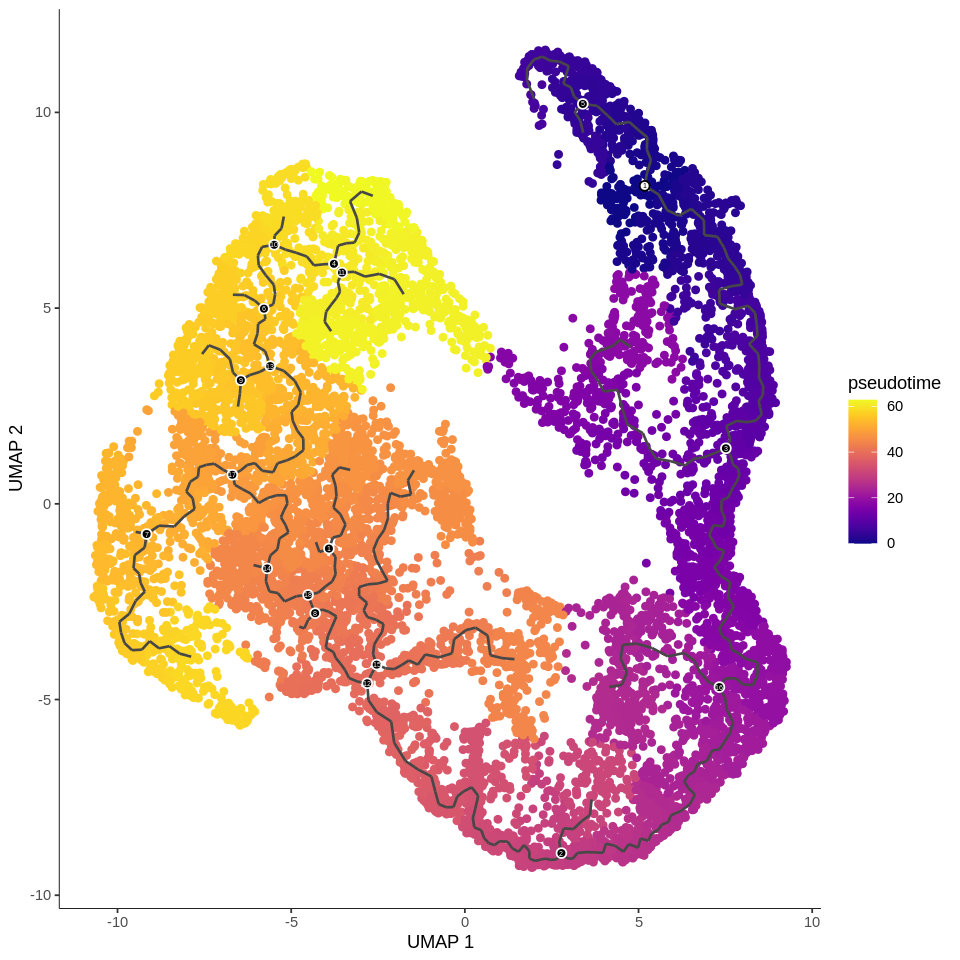

In [35]:
# check the trajetory plot 
options(repr.plot.width=8, repr.plot.height=8)
plot_cells(mon3.cds,
           color_cells_by = "pseudotime",
           label_cell_groups=FALSE,
           label_leaves=FALSE,
           label_branch_points=TRUE,
           graph_label_size=1.5,
           cell_size = 1.5)

In [36]:
## Conclusion: It seems that the Monocle3 can not identify the differentiation trajectory for trichoblast and the trichoblast and atrichoblast differentiation
## are connected, which is problematic. We thus decided to do the peusodotime analysis separately for trichoblast and atrichoblast, and then merge them. 

## There is another way to convert seurat object to monocle3 object, with the help of Package "Seuratwrapper"

### (just for personal back-up, can skip this part if not interested)

In [74]:
## Monocle3 analysis, copied: https://stuartlab.org/signac/articles/monocle.html
epidermis.cds <- as.cell_data_set(sub.epidermis2)

Warning message:
“Monocle 3 trajectories require cluster partitions, which Seurat does not calculate. Please run 'cluster_cells' on your cell_data_set object”


In [59]:
# More Monocle3 processing of epidermis cell dataset-2
epidermis.cds <- cluster_cells(cds = epidermis.cds, reduction_method = "UMAP", cluster_method = "louvain")

In [75]:
# More Monocle3 processing of epidermis cell dataset-3
epidermis.cds <- learn_graph(epidermis.cds, use_partition = TRUE)

  |======================================================================| 100%


Warning message in igraph::graph.dfs(stree_ori, root = root_cell, neimode = "all", :
“Argument `neimode' is deprecated; use `mode' instead”


ERROR: Error: names(cds@clusters[[reduction_method]]$partitions) == NULL


In [61]:
# Monocle3-order cells
epidermis.cds <- order_cells(epidermis.cds, reduction_method = "UMAP", root_cells = colnames(epidermis.cds)[which(epidermis.cds$seurat_clusters == "13")])

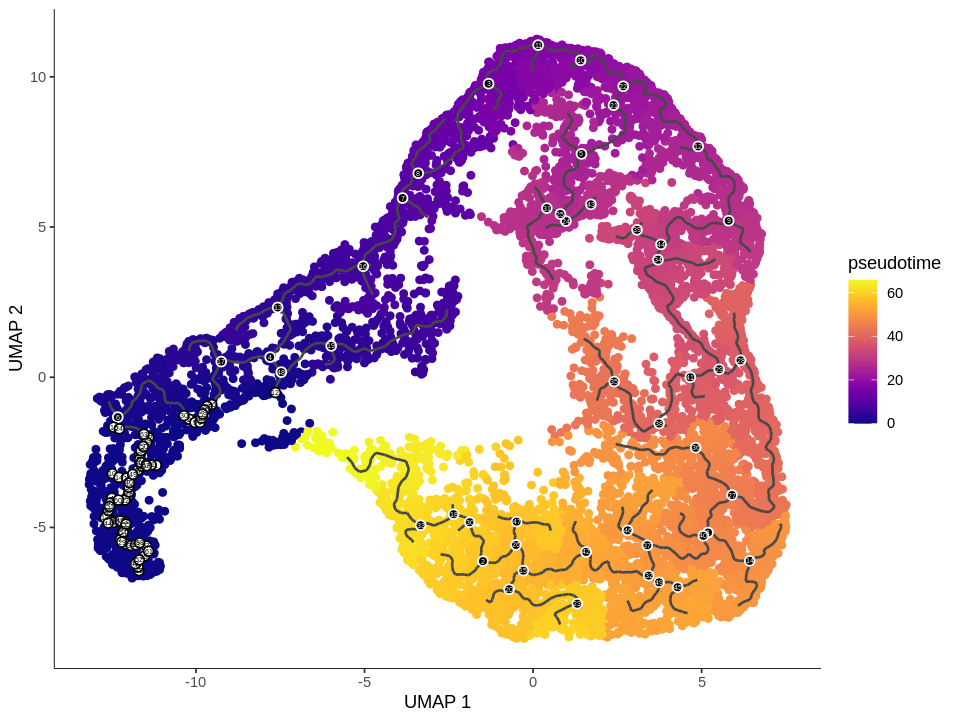

In [66]:
## check the trajetory plot 
options(repr.plot.width=8, repr.plot.height=6)
plot_cells(epidermis.cds,
           color_cells_by = "pseudotime",
           label_cell_groups=FALSE,
           label_leaves=FALSE,
           label_branch_points=TRUE,
           graph_label_size=1.5,
           cell_size = 1.5)

In [40]:
# Extract the pseudotime values and add to the Seurat object
sub.epidermis2 <- AddMetaData(object = sub.epidermis2,
                              metadata = epidermis.cds@principal_graph_aux@listData$UMAP$pseudotime,
                              col.name = "pseudotimevalue")

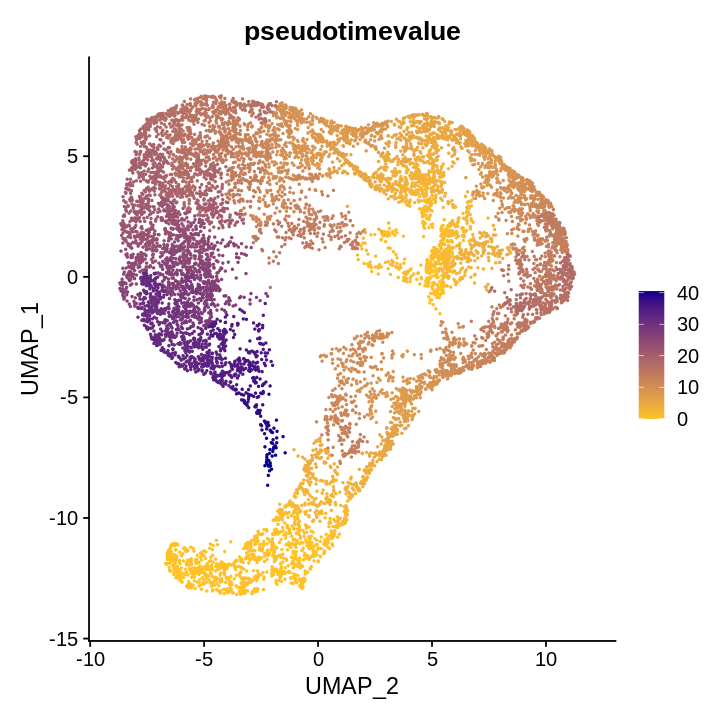

In [48]:
# Plotting with converting UMAP 1 and UMAP2
options(repr.plot.width=6, repr.plot.height=6)
FeaturePlot(sub.epidermis2, "pseudotimevalue", pt.size = 0.3,dims = c(2, 1),cols = c("goldenrod1", "blue4"))

## Analyze the peseudotime developmental trajectory separately for Atichoblast and trichoblast

### Extract Atrichoblast

In [9]:
# Subgroup the atrichobladst cells
atri <- subset(sub.epidermis2, cells=colnames(sub.epidermis2)[which(sub.epidermis2$defined_clusters=="Meristem Epidermis"|
                                                                   sub.epidermis2$defined_clusters=="Elongation Epidermis"|
                                                                   sub.epidermis2$defined_clusters=="Elongation Atrichoblast"|
                                                                   sub.epidermis2$defined_clusters=="Maturation Atrichoblast")])

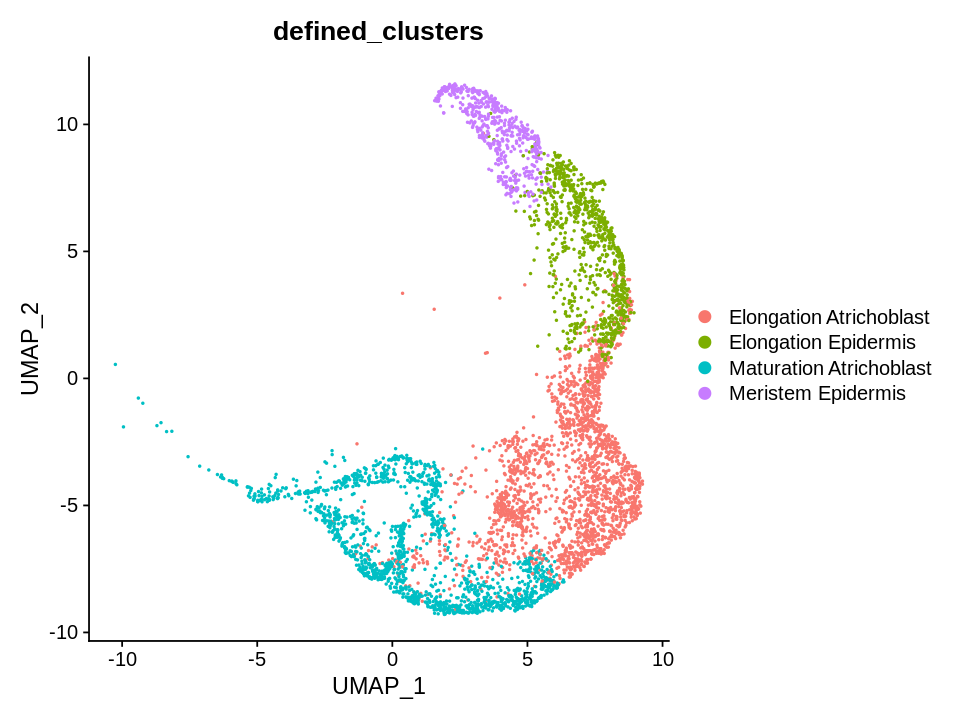

In [10]:
# Check whether the subgrouping is correct
DimPlot(atri, reduction = "umap",group.by = "defined_clusters")

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
15:31:26 UMAP embedding parameters a = 0.9922 b = 1.112

15:31:26 Read 5060 rows and found 4 numeric columns

15:31:26 Using Annoy for neighbor search, n_neighbors = 100

15:31:26 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:31:27 Writing NN index file to temp file /tmp/RtmpAVaWtp/file2fb33a7cb16696

15:31:27 Searching Annoy index using 1 thread, search_k = 10000

15:31:35 Annoy recall = 100%

15:31:37 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbor

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5060
Number of edges: 137029

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9054
Number of communities: 12
Elapsed time: 0 seconds


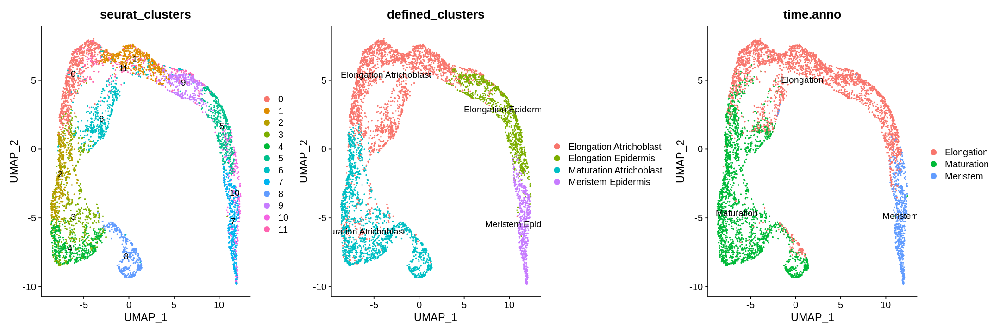

In [11]:
# Re-run PCA for the data subet
atri <- RunPCA(atri, npcs = 10, verbose = FALSE, approx = TRUE)
# Rerun UMAP to make the clusters simpler
atri <- RunUMAP(atri, reduction = "pca",n.neighbors = 100L, min.dist = 0.3, dims = 1:4)
atri <- FindNeighbors(atri, reduction = "pca", dims = 1:4)
atri <- FindClusters(atri, resolution = 0.5)
# Use Dimplot to check the clustering result
options(repr.plot.width=18, repr.plot.height=6)
DimPlot(atri, reduction = "umap",label = TRUE,group.by = c("seurat_clusters","defined_clusters","time.anno"), ncol = 3)

In [12]:
# Use monocle3 embedded function to convert seurat project to monocle3 project
atri.cds <- ToMonocle3(atri,scale_all = FALSE,
                       assay = "SCT",
                       reduction_for_projection = "umap",
                       UMAP_cluster_slot = NULL)

Projecting gene loadings for all Seurat genes in scale.data slot

Warning message in print.DimReduc(x = redeuc, dims = dims.print, nfeatures = nfeatures.print, :
“Only 2 dimensions have been computed.”


UMAP_ 1 
Positive:  LOC-Os08g06344, LOC-Os04g38270, LOC-Os05g46430, LOC-Os08g01870, LOC-Os03g15070, LOC-Os01g05694, LOC-Os08g01600, LOC-Os02g33610, LOC-Os05g18790, LOC-Os04g25410 
	   LOC-Os08g24310, LOC-Os01g67950, LOC-Os03g54780, LOC-Os05g51119, LOC-Os12g08820, LOC-Os08g29669, LOC-Os02g54120, LOC-Os03g02900, LOC-Os02g10900, LOC-Os09g36976 
Negative:  LOC-Os11g24170, LOC-Os03g51250, LOC-Os06g08620, LOC-Os05g02510, LOC-Os12g41690, LOC-Os03g43720, LOC-Os05g39560, LOC-Os03g03610, LOC-Os12g41710, LOC-Os01g55190 
	   LOC-Os03g13140, LOC-Os02g04730, LOC-Os01g31220, LOC-Os07g28340, LOC-Os03g61990, LOC-Os12g14059, LOC-Os06g08490, LOC-Os03g15330, LOC-Os05g02520, LOC-Os02g43860 
UMAP_ 2 
Positive:  LOC-Os07g29390, LOC-Os06g08490, LOC-Os07g44550, LOC-Os05g39580, LOC-Os05g19600, LOC-Os01g54930, LOC-Os01g64840, LOC-Os03g49270, LOC-Os10g19180, LOC-Os01g40470 
	   LOC-Os10g30340, LOC-Os10g37600, LOC-Os10g30330, LOC-Os07g15640, LOC-Os05g27320, LOC-Os05g44930, LOC-Os01g45070, LOC-Os03g61470, LOC-Os10g

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.umap; see ?make.names for more details on syntax validity”
Initializing CDS object

Making an SCE object from the Seurat object to facilitate transfer of information from SCE to CDS

Loading in all Seurat reductions (PCA, HARMONY, UMAP, etc.) into CDS

Loading in specified Seurat assay into CDS

Loading in Seurat gene names into CDS

Loading in Seurat gene loadings into CDS

Get user specified selected clusters (or active idents) from Seurat and load into CDS

Setting all cells as belonging to one partition (multiple partitions not supported yet)

Done



In [13]:
# Skip the cluster_cells process and run learn_graph function
atri.cds <- learn_graph(atri.cds)
# a helper function by Che-Wei to identify the root principal points:
get_earliest_principal_node <- function(cds, root="Meristem Epidermis"){
  cell_ids <- which(colData(cds)[, "defined_clusters"] == root)
  
  closest_vertex <-
  cds@principal_graph_aux[["UMAP"]]$pr_graph_cell_proj_closest_vertex
  closest_vertex <- as.matrix(closest_vertex[colnames(cds), ])
  root_pr_nodes <-
  igraph::V(principal_graph(cds)[["UMAP"]])$name[as.numeric(names
  (which.max(table(closest_vertex[cell_ids,]))))]
  
  root_pr_nodes
}
atri.cds <- order_cells(atri.cds, root_pr_nodes=get_earliest_principal_node(atri.cds))

  |======================================================================| 100%


Warning message in igraph::graph.dfs(stree_ori, root = root_cell, neimode = "all", :
“Argument `neimode' is deprecated; use `mode' instead”


Warning message:
“`select_()` was deprecated in dplyr 0.7.0.
ℹ Please use `select()` instead.
ℹ The deprecated feature was likely used in the monocle3 package.
  Please report the issue to the authors.”


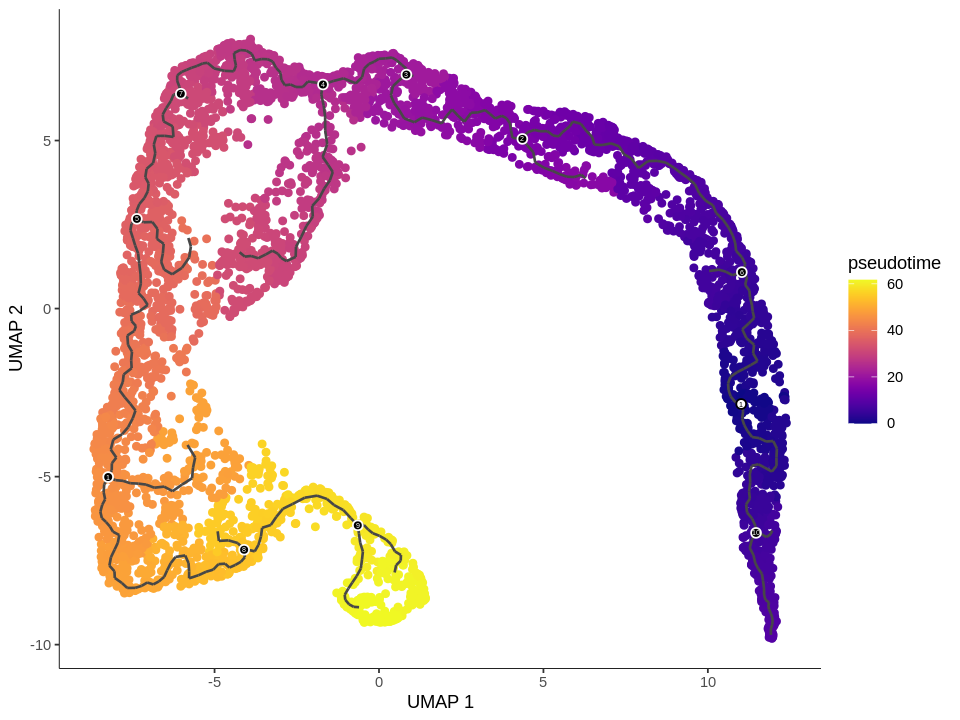

In [14]:
## check the trajetory plot 
options(repr.plot.width=8, repr.plot.height=6)
plot_cells(atri.cds,
           color_cells_by = "pseudotime",
           label_cell_groups=FALSE,
           label_leaves=FALSE,
           label_branch_points=TRUE,
           graph_label_size=1.5,
           cell_size = 1.5)

### Extract Trichoblast

In [15]:
# Subgroup the trichobladst cells
tri <- subset(sub.epidermis2, cells=colnames(sub.epidermis2)[which(sub.epidermis2$defined_clusters=="Meristem Epidermis"|
                                                                   sub.epidermis2$defined_clusters=="Elongation Epidermis"|
                                                                   sub.epidermis2$defined_clusters=="Elongation Trichoblast"|
                                                                   sub.epidermis2$defined_clusters=="Maturation Trichoblast")])

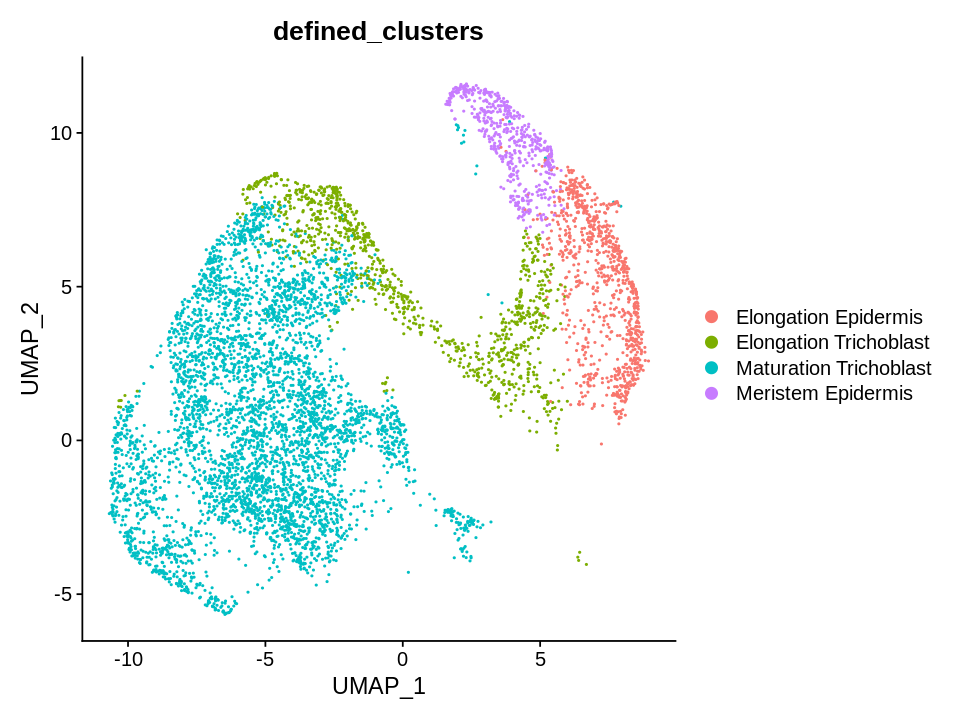

In [16]:
# Check whether the subgrouping is correct
DimPlot(tri, reduction = "umap",group.by = "defined_clusters")

15:33:46 UMAP embedding parameters a = 0.9922 b = 1.112

15:33:46 Read 7011 rows and found 4 numeric columns

15:33:46 Using Annoy for neighbor search, n_neighbors = 100

15:33:46 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:33:48 Writing NN index file to temp file /tmp/RtmpAVaWtp/file2fb33a6dafeabf

15:33:48 Searching Annoy index using 1 thread, search_k = 10000

15:34:00 Annoy recall = 100%

15:34:02 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 100

15:34:06 Initializing from normalized Laplacian + noise (using irlba)

15:34:07 Commencing optimization for 500 epochs, with 576382 positive edges

15:34:25 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7011
Number of edges: 190769

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9096
Number of communities: 15
Elapsed time: 1 seconds


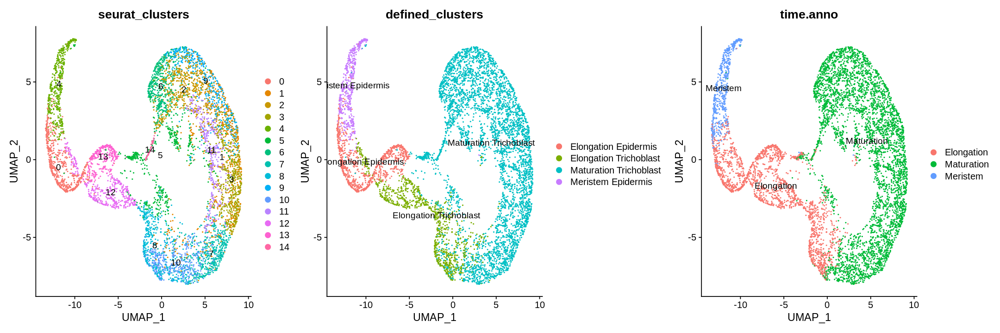

In [17]:
# Re-run PCA for the data subet
tri <- RunPCA(tri, npcs = 10, verbose = FALSE, approx = TRUE)
# Rerun UMAP to make the clusters simpler
tri <- RunUMAP(tri, reduction = "pca",n.neighbors = 100L, min.dist = 0.3, dims = 1:4)
tri <- FindNeighbors(tri, reduction = "pca", dims = 1:4)
tri <- FindClusters(tri, resolution = 0.5)
# Use Dimplot to check the clustering result
# Use Dimplot to check the clustering result
options(repr.plot.width=18, repr.plot.height=6)
DimPlot(tri, reduction = "umap",label = TRUE,group.by = c("seurat_clusters","defined_clusters","time.anno"), ncol = 3)

In [18]:
# Use monocle3 embedded function to convert seurat project to monocle3 project
tri.cds <- ToMonocle3(tri,scale_all = FALSE,
                       assay = "SCT",
                       reduction_for_projection = "umap",
                       UMAP_cluster_slot = NULL)

Projecting gene loadings for all Seurat genes in scale.data slot

Warning message in print.DimReduc(x = redeuc, dims = dims.print, nfeatures = nfeatures.print, :
“Only 2 dimensions have been computed.”


UMAP_ 1 
Positive:  LOC-Os06g08880, LOC-Os03g26450, LOC-Os03g55070, LOC-Os01g49120, LOC-Os10g28520, LOC-Os07g12830, LOC-Os07g16364, LOC-Os04g49530, LOC-Os01g49219, LOC-Os03g46740 
	   LOC-Os06g08620, LOC-Os01g49190, LOC-Os04g58700, LOC-Os01g52810, LOC-Os01g49154, LOC-Os03g51250, LOC-Os10g32880, LOC-Os10g10720, LOC-Os07g47290, LOC-Os04g48130 
Negative:  LOC-Os08g06344, LOC-Os04g38270, LOC-Os03g15070, LOC-Os01g05694, LOC-Os05g39580, LOC-Os05g19600, LOC-Os08g01870, LOC-Os05g51119, LOC-Os05g46430, LOC-Os02g33610 
	   LOC-Os08g01600, LOC-Os05g18790, LOC-Os07g29390, LOC-Os01g67950, LOC-Os03g54780, LOC-Os10g38600, LOC-Os04g25410, LOC-Os04g32550, LOC-Os02g48280, LOC-Os02g35630 
UMAP_ 2 
Positive:  LOC-Os12g41710, LOC-Os11g24170, LOC-Os02g42360, LOC-Os02g47970, LOC-Os05g39110, LOC-Os03g36490, LOC-Os12g41690, LOC-Os12g35560, LOC-Os07g28910, LOC-Os03g57545 
	   LOC-Os04g49610, LOC-Os10g05180, LOC-Os12g44020, LOC-Os02g04730, LOC-Os01g31220, LOC-Os03g18110, LOC-Os02g41590, LOC-Os04g59510, LOC-Os06g

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.umap; see ?make.names for more details on syntax validity”
Initializing CDS object

Making an SCE object from the Seurat object to facilitate transfer of information from SCE to CDS

Loading in all Seurat reductions (PCA, HARMONY, UMAP, etc.) into CDS

Loading in specified Seurat assay into CDS

Loading in Seurat gene names into CDS

Loading in Seurat gene loadings into CDS

Get user specified selected clusters (or active idents) from Seurat and load into CDS

Setting all cells as belonging to one partition (multiple partitions not supported yet)

Done



In [19]:
# Skip the cluster_cells process and run learn_graph function
tri.cds <- learn_graph(tri.cds)
# a helper function by Che-Wei to identify the root principal points:
get_earliest_principal_node <- function(cds, root="Meristem Epidermis"){
  cell_ids <- which(colData(cds)[, "defined_clusters"] == root)
  
  closest_vertex <-
  cds@principal_graph_aux[["UMAP"]]$pr_graph_cell_proj_closest_vertex
  closest_vertex <- as.matrix(closest_vertex[colnames(cds), ])
  root_pr_nodes <-
  igraph::V(principal_graph(cds)[["UMAP"]])$name[as.numeric(names
  (which.max(table(closest_vertex[cell_ids,]))))]
  
  root_pr_nodes
}
tri.cds <- order_cells(tri.cds, root_pr_nodes=get_earliest_principal_node(tri.cds))

  |======================================================================| 100%


Warning message in igraph::graph.dfs(stree_ori, root = root_cell, neimode = "all", :
“Argument `neimode' is deprecated; use `mode' instead”


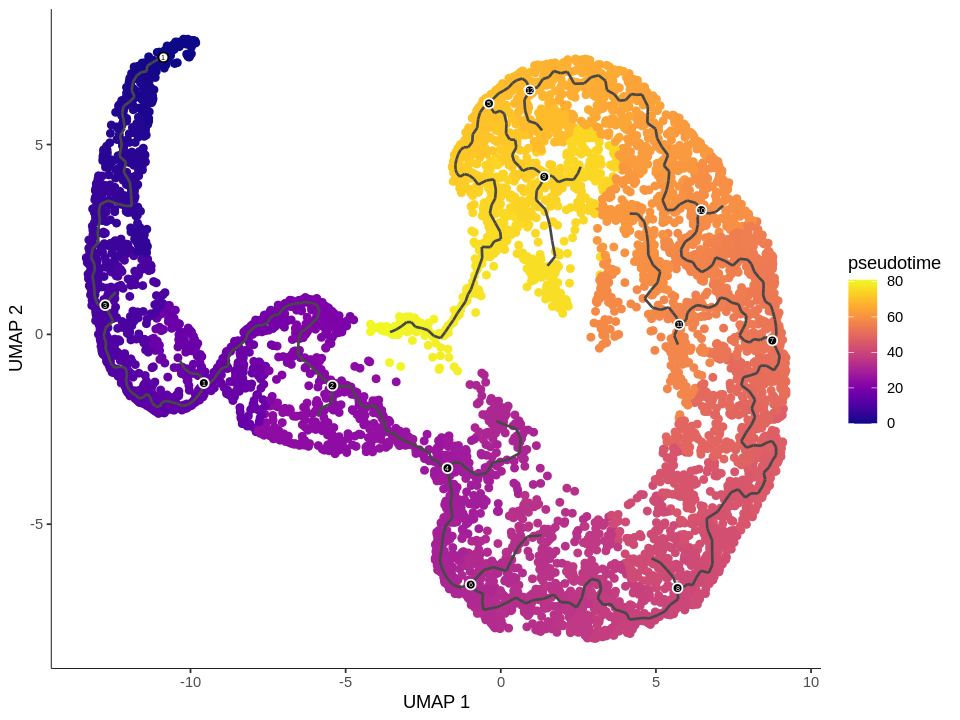

In [20]:
## check the trajetory plot 
options(repr.plot.width=8, repr.plot.height=6)
plot_cells(tri.cds,
           color_cells_by = "pseudotime",
           label_cell_groups=FALSE,
           label_leaves=FALSE,
           label_branch_points=TRUE,
           graph_label_size=1.5,
           cell_size = 1.5)

### Merge back to sub.epidermis2

In [21]:
# Store the pseudotime values from atri and tri sub-objects back to the sub.epidermis object, for the common clusters, calculate the means: (A + B)/2
sub.epidermis2$pseudotime <- rep(0, ncol(sub.epidermis2))
sub.epidermis2$pseudotime[which(sub.epidermis2$defined_clusters=="Maturation Atrichoblast")] = pseudotime(atri.cds)[which(atri$defined_clusters=="Maturation Atrichoblast")]
sub.epidermis2$pseudotime[which(sub.epidermis2$defined_clusters=="Elongation Atrichoblast")] = pseudotime(atri.cds)[which(atri$defined_clusters=="Elongation Atrichoblast")]
sub.epidermis2$pseudotime[which(sub.epidermis2$defined_clusters=="Maturation Trichoblast")] = pseudotime(tri.cds)[which(tri$defined_clusters=="Maturation Trichoblast")]
sub.epidermis2$pseudotime[which(sub.epidermis2$defined_clusters=="Elongation Trichoblast")] = pseudotime(tri.cds)[which(tri$defined_clusters=="Elongation Trichoblast")]
sub.epidermis2$pseudotime[which(sub.epidermis2$defined_clusters=="Elongation Epidermis")] = (((pseudotime(tri.cds)[which(tri$defined_clusters=="Elongation Epidermis")]) + (pseudotime(atri.cds)[which(atri$defined_clusters=="Elongation Epidermis")]))/2)
sub.epidermis2$pseudotime[which(sub.epidermis2$defined_clusters=="Meristem Epidermis")] =(((pseudotime(tri.cds)[which(tri$defined_clusters=="Meristem Epidermis")]) + (pseudotime(atri.cds)[which(atri$defined_clusters=="Meristem Epidermis")]))/2)

In [22]:
# change the UMAP2 value to invert the UMAP plot
sub.epidermis2[["umap"]]@cell.embeddings[,2] <- sub.epidermis2[["umap"]]@cell.embeddings[,2]*-1

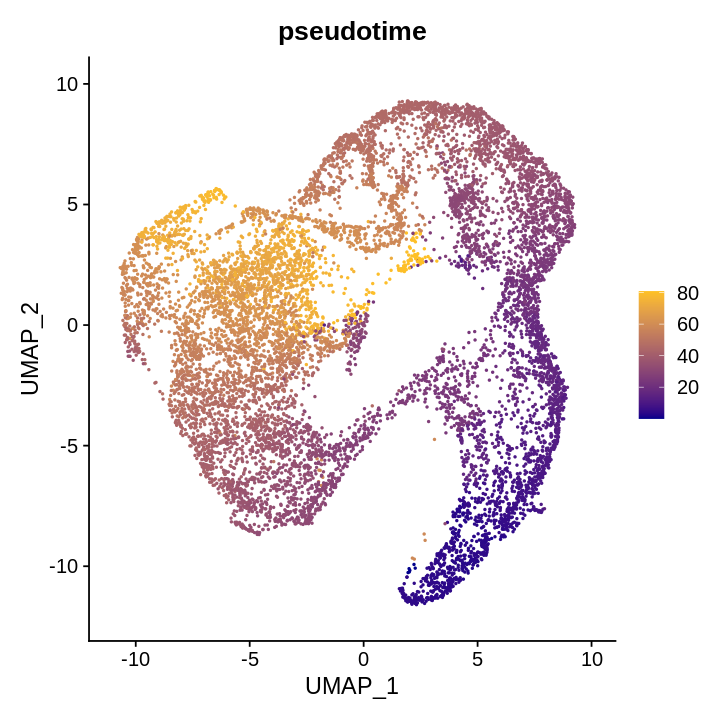

In [23]:
# Plotting
options(repr.plot.width=6, repr.plot.height=6)
FeaturePlot(sub.epidermis2, "pseudotime", pt.size = 0.3,cols = c("blue4","goldenrod1"))

In [24]:
# Save the rds object with Pseudotime
saveRDS(sub.epidermis2, file = "./1-Root_Atlas/sub.epidermis-with_Pseudotime.rds")

### Separate the pseudotime trajectory into 10 sections

In [4]:
# Read subgrouped epidermis cell Copilot object
sub.epidermis2 <- readRDS("./1-Root_Atlas/sub.epidermis-with_Pseudotime.rds")

In [5]:
# Convert the COPILOT object to Monocle3 cds, need to run "define 'ToMonocle3' function first"
cds <- ToMonocle3(sub.epidermis2,scale_all = FALSE,
                       assay = "SCT",
                       reduction_for_projection = "umap",
                       UMAP_cluster_slot = NULL)

Projecting gene loadings for all Seurat genes in scale.data slot

Warning message in print.DimReduc(x = redeuc, dims = dims.print, nfeatures = nfeatures.print, :
“Only 2 dimensions have been computed.”


UMAP_ 1 
Positive:  LOC-Os07g29390, LOC-Os05g39580, LOC-Os05g19600, LOC-Os07g44550, LOC-Os06g08490, LOC-Os03g49270, LOC-Os05g39560, LOC-Os05g02510, LOC-Os05g51119, LOC-Os01g64840 
	   LOC-Os04g32550, LOC-Os05g50710, LOC-Os10g30330, LOC-Os01g54930, LOC-Os05g44930, LOC-Os10g35436, LOC-Os10g19180, LOC-Os03g61470, LOC-Os10g30340, LOC-Os06g20150 
Negative:  LOC-Os07g12830, LOC-Os06g08880, LOC-Os10g28520, LOC-Os03g55070, LOC-Os03g26450, LOC-Os07g16364, LOC-Os01g49120, LOC-Os04g49530, LOC-Os01g49219, LOC-Os03g46740 
	   LOC-Os04g58700, LOC-Os01g49190, LOC-Os10g10720, LOC-Os10g32880, LOC-Os01g52810, LOC-Os03g43910, LOC-Os08g43930, LOC-Os06g23800, LOC-Os07g47290, LOC-Os01g49154 
UMAP_ 2 
Positive:  LOC-Os11g24170, LOC-Os12g41710, LOC-Os12g41690, LOC-Os02g04730, LOC-Os10g05180, LOC-Os01g31220, LOC-Os03g36490, LOC-Os05g39560, LOC-Os02g42360, LOC-Os12g14059 
	   LOC-Os07g28340, LOC-Os12g44020, LOC-Os02g06380, LOC-Os02g47970, LOC-Os02g41590, LOC-Os07g02210, LOC-Os05g02510, LOC-Os01g45020, LOC-Os12g

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.umap; see ?make.names for more details on syntax validity”
Initializing CDS object

Making an SCE object from the Seurat object to facilitate transfer of information from SCE to CDS

Loading in all Seurat reductions (PCA, HARMONY, UMAP, etc.) into CDS

Loading in specified Seurat assay into CDS

Loading in Seurat gene names into CDS

Loading in Seurat gene loadings into CDS

Get user specified selected clusters (or active idents) from Seurat and load into CDS

Setting all cells as belonging to one partition (multiple partitions not supported yet)

Done



In [6]:
# Run learn_graph and order_cell functions in Monocle3 to create the metadata of pseuotime,
# which can be then replaces with our calculated pseudotime value
cds <- learn_graph(cds)

  |======================================================================| 100%


Warning message in igraph::graph.dfs(stree_ori, root = root_cell, neimode = "all", :
“Argument `neimode' is deprecated; use `mode' instead”


In [7]:
# Run order_cell function
# a helper function by Che-Wei to identify the root principal points:
get_earliest_principal_node <- function(cds, root="Meristem Epidermis"){
  cell_ids <- which(colData(cds)[, "defined_clusters"] == root)
  
  closest_vertex <-
  cds@principal_graph_aux[["UMAP"]]$pr_graph_cell_proj_closest_vertex
  closest_vertex <- as.matrix(closest_vertex[colnames(cds), ])
  root_pr_nodes <-
  igraph::V(principal_graph(cds)[["UMAP"]])$name[as.numeric(names
  (which.max(table(closest_vertex[cell_ids,]))))]
  
  root_pr_nodes
}
cds <- order_cells(cds, root_pr_nodes=get_earliest_principal_node(cds))

In [8]:
# Replace the Monocle3 pseudotime values with our calculated ones (calculate separately for trichoblast and atrichoblast)
cds@principal_graph_aux$UMAP$pseudotime <- sub.epidermis2$pseudotime

In [9]:
# based on the pseudotime value to define 10 groups
pseu <- pseudotime(cds)
s10 <- c(seq(1,round(ncol(cds)/10)*10,round(length(pseu)/10)),ncol(cds)+1)
pseudotime.group <- rep("NA", ncol(cds))
pseudotime.cell.name <- rep("NA", ncol(cds))
for (i in 1:10){
    pseudotime.group[s10[i]: s10[i+1]-1] <- paste0("G",i-1)
    pseudotime.cell.name[s10[i]: s10[i+1]-1] <- names(sort(rank(pseu))[s10[i]: s10[i+1]-1])
}
names(pseudotime.group) <- pseudotime.cell.name
part <- pseudotime.group
cell_group_df <- tibble::tibble(cell=row.names(colData(cds)), 
                                cell_group=part[colnames(cds)])
cds$pseudotime.group <- cell_group_df$cell_group

In [10]:
suppressMessages(library(ggplot2))
suppressMessages(library(RColorBrewer))

In [11]:
brewer.pal(10,"Spectral")

[1] "#9E0142" "#D53E4F" "#F46D43" "#FDAE61" "#FEE08B" "#E6F598" "#ABDDA4"
 [8] "#66C2A5" "#3288BD" "#5E4FA2"

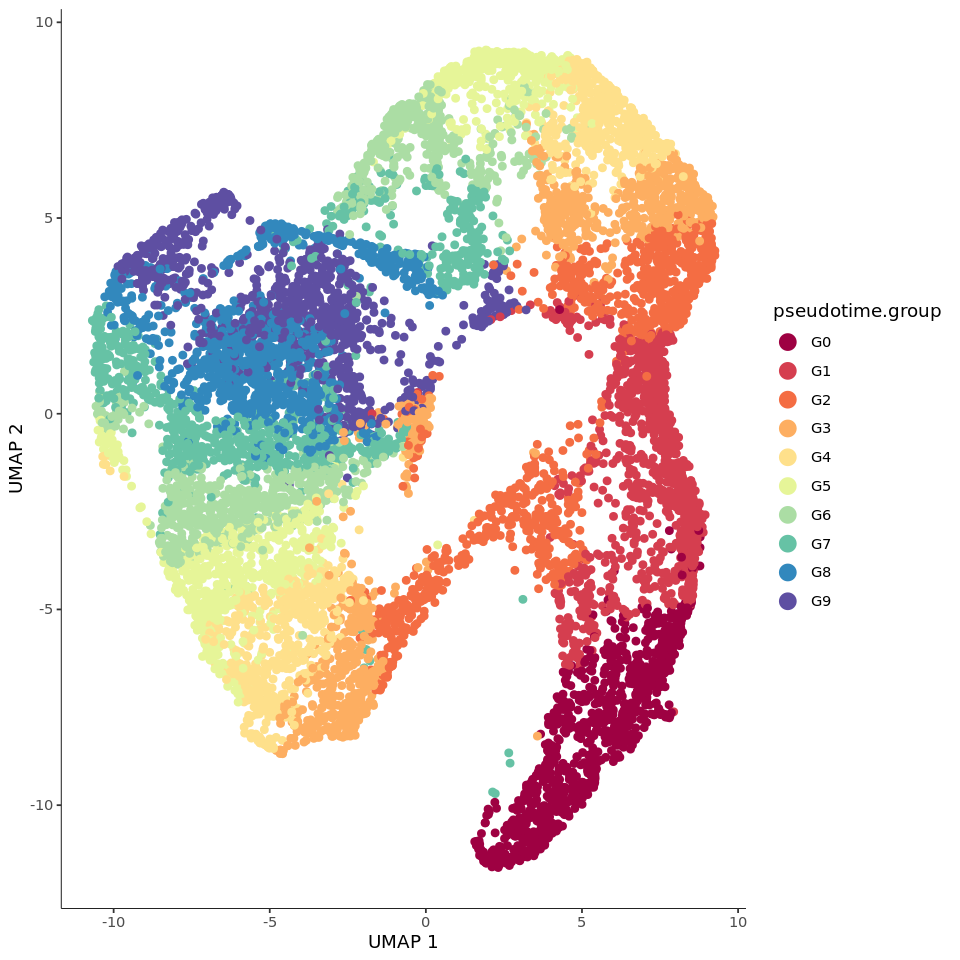

In [12]:
# Plot the cell differentiation trajectory
options(repr.plot.width=8, repr.plot.height=8)
plot_cells(cds,
           color_cells_by = "pseudotime.group",
           show_trajectory_graph = FALSE,
           label_cell_groups=FALSE,
           label_leaves=FALSE,
           label_branch_points=FALSE,
           graph_label_size=1.5,
           cell_size = 1.5)  + scale_colour_manual(values = brewer.pal(10,"Spectral"))

## Plot the selected gene expression dynamics

In [53]:
## Specify one epdiermis marker gene and three trichoblast marker gene
target_genes <- c("LOC-Os03g19990", "LOC-Os12g05380", "LOC-Os10g42750", "LOC-Os06g48050")

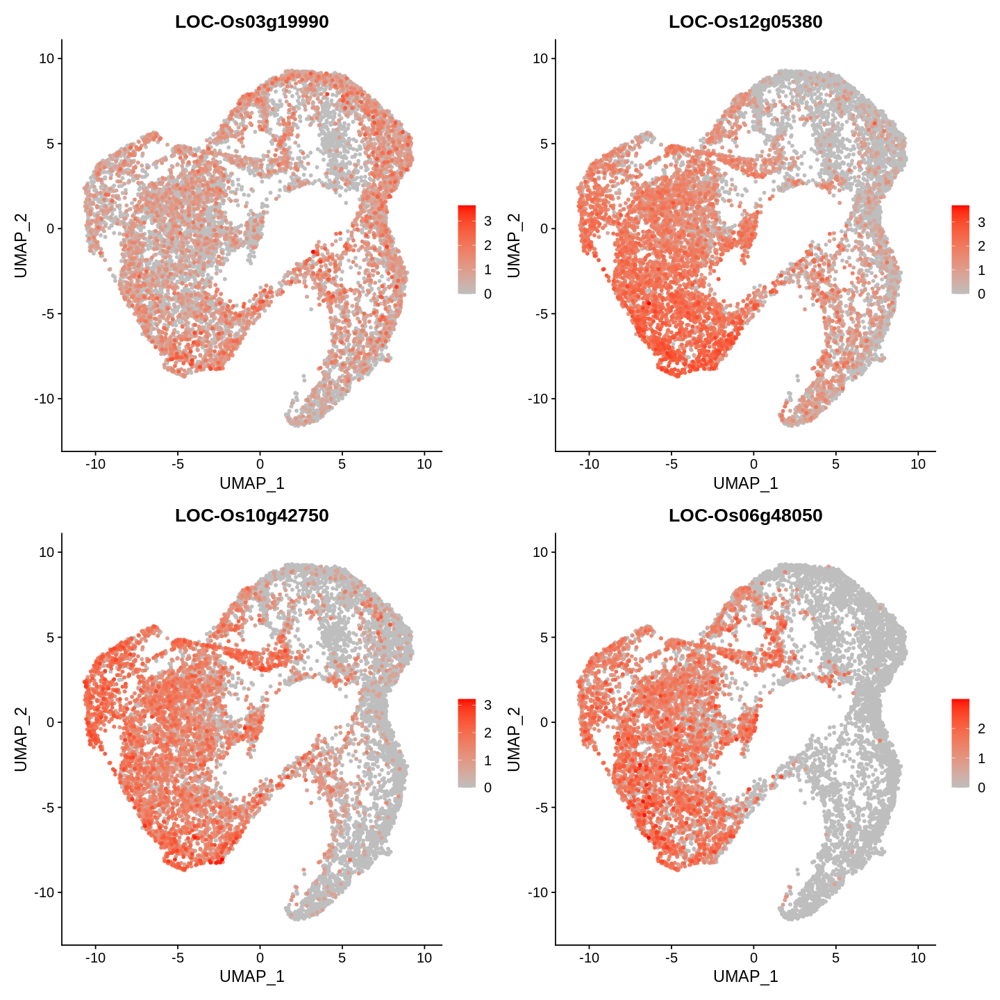

In [71]:
# Check marker gene expression with featureplots
DefaultAssay(sub.epidermis2) <- "SCT"
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(sub.epidermis2, features = target_genes,
            cols = c("grey", "red"), label=F, repel=F, pt.size = 1, 
            label.size = 1.5, order=T, ncol = 2)

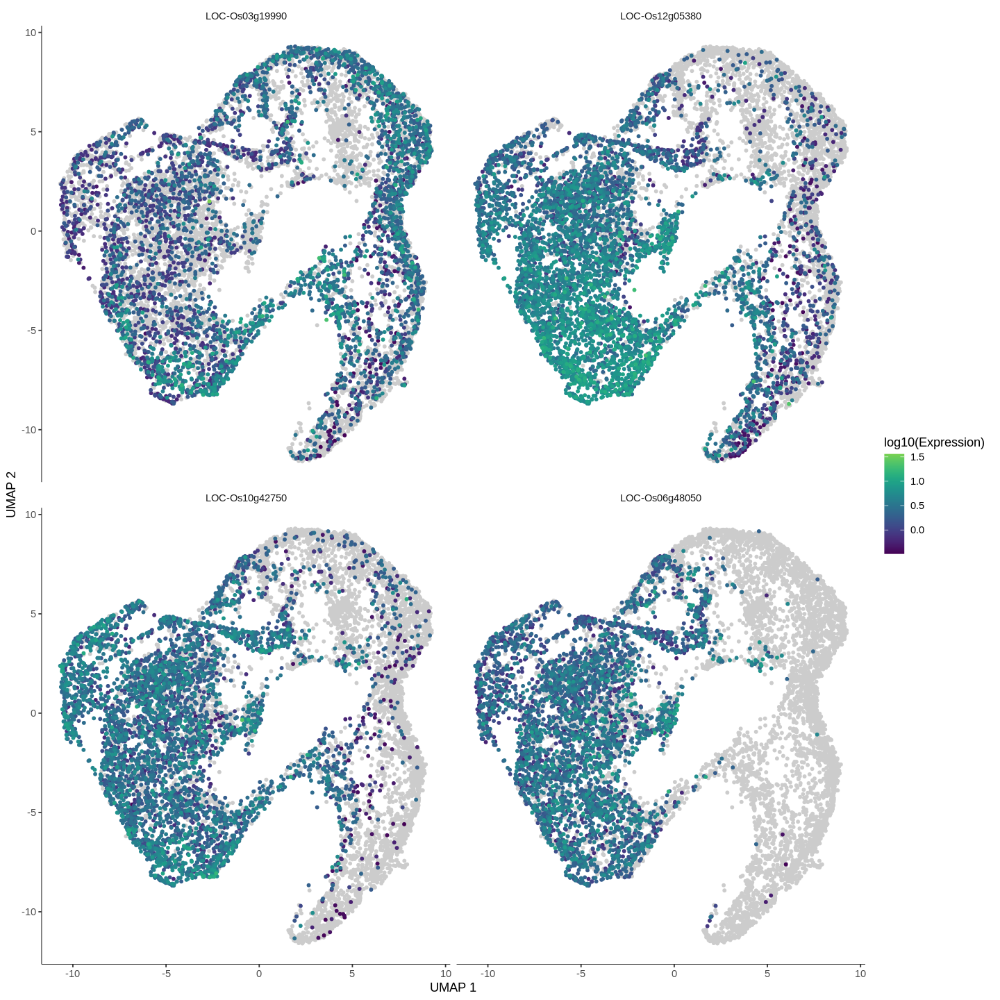

In [70]:
# Plot the gene expression dyanmics with monocle featureplot
options(repr.plot.width=12, repr.plot.height=12)
plot_cells(cds, genes=target_genes,
           show_trajectory_graph=FALSE,
           label_cell_groups=FALSE,
           label_leaves=FALSE,cell_size = 1)

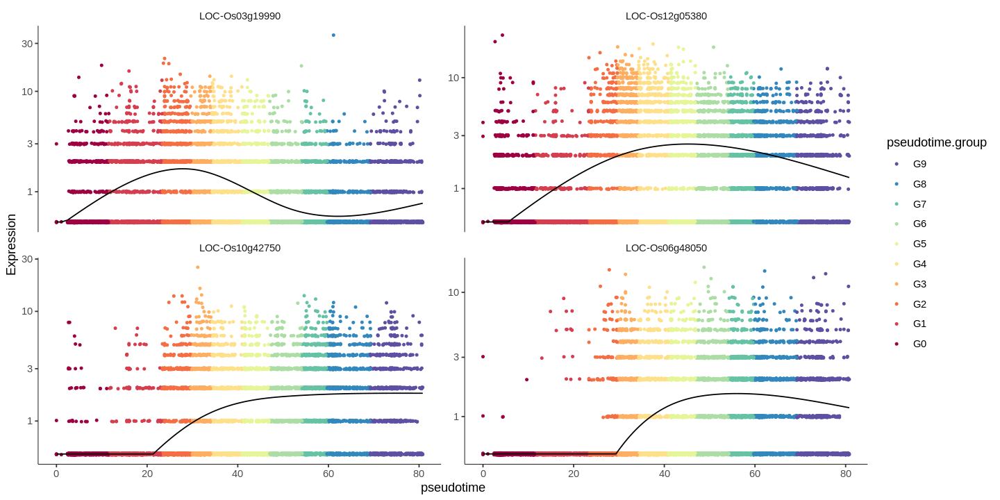

In [60]:
# Plot the gene expression dyanmics with linear plot
cds$pseudotime.group <- factor(cds$pseudotime.group, levels = rev(c("G0","G1","G2","G3","G4","G5","G6","G7","G8","G9")))
lineage_cds <- cds[rowData(cds)$gene_short_name %in% target_genes,]
options(repr.plot.width=12, repr.plot.height=6)
plot_genes_in_pseudotime(lineage_cds,
                         color_cells_by="pseudotime.group",
                         min_expr=0.5, ncol=2, panel_order = target_genes
)+ scale_colour_manual(values = rev(brewer.pal(10,"Spectral")))

## Find DE genes and draw the heatmap plots

In [13]:
# Identify the DE genes with Monocle3 graph_test function
test_res <- graph_test(
  cds,
  neighbor_graph = c("knn", "principal_graph"),
  reduction_method = "UMAP",
  k = 25,
  method = c("Moran_I"),
  alternative = "greater",
  expression_family = "quasipoisson",
  cores = 4,
  verbose = FALSE
)

  |====================================================| 100%, Elapsed 01:27:29


In [32]:
# Save the DE gene list
write.csv(test_res, "./1-Root_Atlas/test_res-by-Mond3.csv",row.names = TRUE)

In [13]:
# Import the DE gene list
test_res <- read.table(file = "./1-Root_Atlas/test_res-by-Mond3.csv",row.names = 1, header=TRUE, sep = ",")

In [14]:
# Heatmap plot to reveal the gene functions
deg_ids <- rownames(subset(test_res, q_value < 0.01))
deg_name <- subset(test_res, q_value < 0.01)$gene_short_name

In [15]:
head (test_res)

,status,p_value,morans_test_statistic,morans_I,gene_short_name,q_value
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
LOC-Os01g01010,OK,5.116516e-15,7.736327,0.020236653,LOC-Os01g01010,1.230320e-14
LOC-Os01g01019,OK,5.164650e-02,1.629095,0.004159613,LOC-Os01g01019,7.416631e-02
LOC-Os01g01030,OK,2.663745e-03,2.786535,0.007164346,LOC-Os01g01030,4.262551e-03
LOC-Os01g01040,OK,6.365610e-43,13.683555,0.035926369,LOC-Os01g01040,2.203258e-42
LOC-Os01g01050,OK,1.118794e-59,16.249892,0.042637319,LOC-Os01g01050,4.375333e-59
LOC-Os01g01060,OK,0.000000e+00,124.424655,0.327407121,LOC-Os01g01060,0.000000e+00


In [16]:
head (deg_name)

[1] "LOC-Os01g01010" "LOC-Os01g01030" "LOC-Os01g01040" "LOC-Os01g01050"
[5] "LOC-Os01g01060" "LOC-Os01g01070"

In [30]:
## Pick the gene to be labeled, not working
genes_to_label <- filter(test_res, deg_name %in% c("LOC-Os12g05380", "LOC-Os10g42750", "LOC-Os06g48050")) 

In [17]:
# Use Monocle3 find_gene_modules function
gene_module_df <- find_gene_modules(
  cds[deg_ids,],
  reduction_method = c("UMAP"),
  max_components = 2,
  umap.metric = "cosine",
  umap.min_dist = 0.1,
  umap.n_neighbors = 15L,
  umap.fast_sgd = FALSE,
  umap.nn_method = "annoy",
  k = 20,
  leiden_iter = 1,
  partition_qval = 0.05,
  weight = FALSE,
  resolution = 10^-6,
  random_seed = 0L,
  cores = 1,
  verbose = FALSE
)

Spectral initialization failed to converge, using random initialization instead



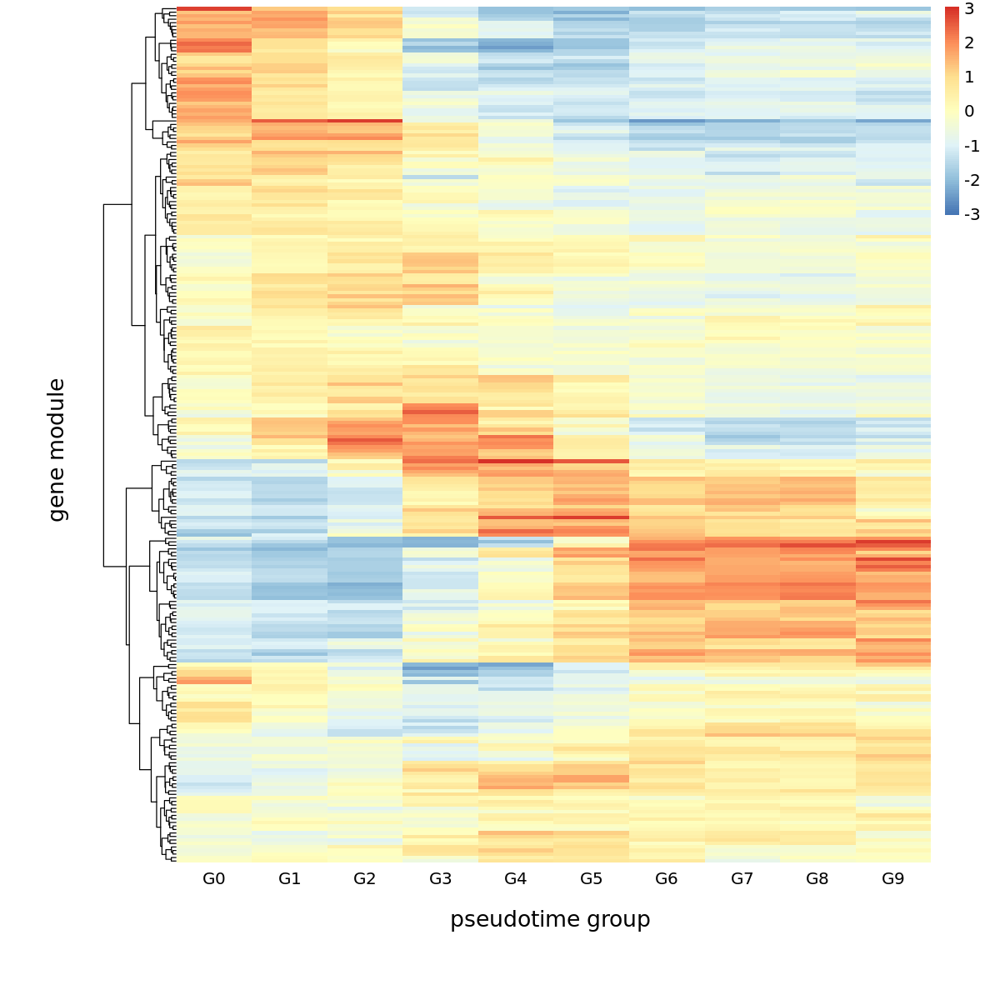

In [62]:
# Heatmap plot to reveal the gene functions
draw_colnames_horizontal <- function (coln, gaps, ...) {
    coord <- pheatmap:::find_coordinates(length(coln), gaps)
    x     <- coord$coord - 0.5 * coord$size
    res   <- grid::textGrob(
      coln, x = x, y = unit(1, "npc") - unit(3,"bigpts"),
      vjust = 1.5, hjust = 0.5, rot = 0, gp = grid::gpar(...)
    )
    return(res)
}
assignInNamespace(
  x = "draw_colnames",
  value = "draw_colnames_horizontal",
  ns = asNamespace("pheatmap")
)
agg_mat <- aggregate_gene_expression(cds, gene_module_df, cell_group_df)
row.names(agg_mat) <- stringr::str_c("Module ", row.names(agg_mat))
colnames(agg_mat) <- stringr::str_c("", colnames(agg_mat))

options(repr.plot.width=10, repr.plot.height=10)
setHook("grid.newpage", function() pushViewport(viewport(x=1,y=1,width=0.9, height=0.9, name="vp", just=c("right","top"))), action="prepend")
pheatmap::pheatmap(agg_mat, cluster_rows=TRUE, cluster_cols=FALSE,
                   scale="column", clustering_method="complete",
                   fontsize=12, labels_row=rep("", length(unique(gene_module_df$module))))
setHook("grid.newpage", NULL, "replace")
grid.text("pseudotime group", y=-0.02, gp=grid::gpar(fontsize=16))
grid.text("gene module", x=-0.05, rot=90, gp=grid::gpar(fontsize=16))

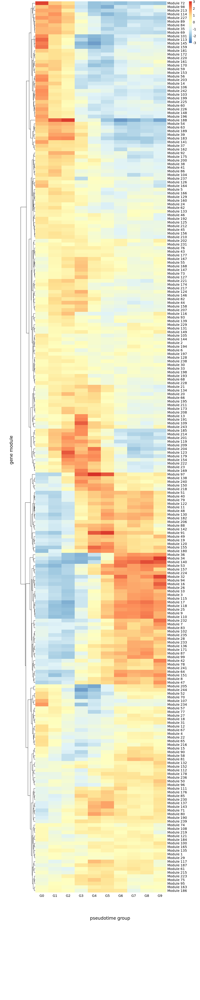

In [63]:
options(repr.plot.width=10, repr.plot.height=50)
setHook("grid.newpage", function() pushViewport(viewport(x=1,y=1,width=0.9, height=0.9, name="vp", just=c("right","top"))), action="prepend")
pheatmap::pheatmap(agg_mat, cluster_rows=TRUE, cluster_cols=FALSE,
                   scale="column", clustering_method="complete",
                   fontsize=12)
setHook("grid.newpage", NULL, "replace")
grid.text("pseudotime group", y=-0.02, gp=grid::gpar(fontsize=16))
grid.text("gene module", x=-0.05, rot=90, gp=grid::gpar(fontsize=16))

In [37]:
library(ComplexHeatmap)

In [65]:
class(agg_mat)

[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"

In [92]:
show.label <- c("LOC-Os12g05380", "LOC-Os10g42750", "LOC-Os06g48050")
show.id <- c("Module 40", "Module 11", "Module 99")
    mark_anno = rowAnnotation(foo = anno_mark(at = match(show.id,rownames(agg_mat)), labels = show.label, labels_gp = gpar(col = "black", fontsize = 16)))
    H <- Heatmap(as.matrix(agg_mat),
            col = colorRampPalette(rev(brewer.pal(n = 11, name =
      "RdYlBu")))(11),
                show_column_names = F,
                cluster_columns = F,
                cluster_rows=T,
                show_row_names = F,
                right_annotation=mark_anno,
                show_heatmap_legend=F,
                clustering_method_rows="complete",
                use_raster=F,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

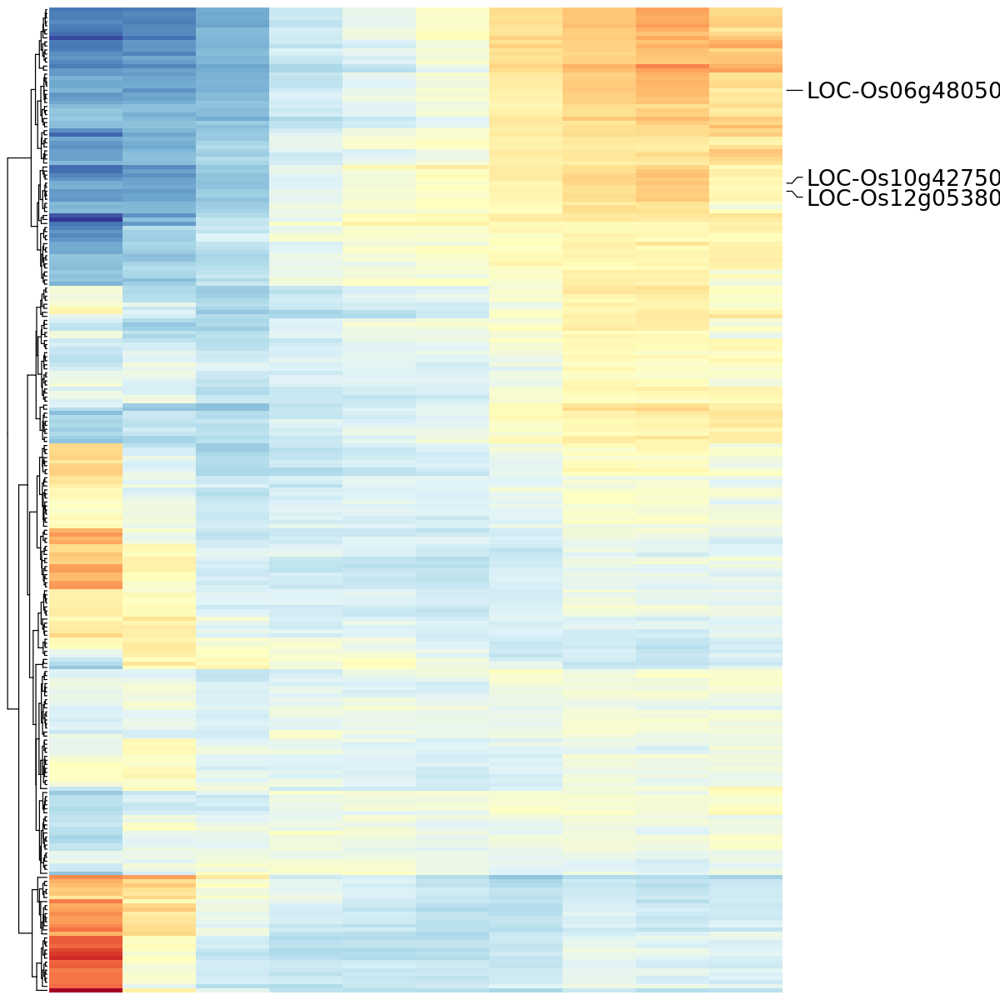

In [93]:
options(repr.plot.width=10, repr.plot.height=10)
draw(H)

In [122]:
show.label <- c("LOC-Os12g05380", "LOC-Os10g42750", "LOC-Os06g48050")
show.id <- c("Module 40", "Module 11", "Module 99")
    mark_anno = rowAnnotation(foo = anno_mark(at = match(show.id,rownames(agg_mat)), labels = show.label, labels_gp = gpar(col = "black", fontsize = 16)))
    H <- Heatmap(scale(as.matrix(agg_mat)),
            col = colorRampPalette(rev(brewer.pal(n = 11, name =
      "RdYlBu")))(11),
                show_column_names = F,
                cluster_columns = F,
                cluster_rows=T,
                show_row_names = T,
                right_annotation=mark_anno,
                show_heatmap_legend=F,
                clustering_method_rows="complete",
                use_raster=F,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

In [128]:
order <- rownames(agg_mat)[row_order(H)]

Warning message:
“The heatmap has not been initialized. You might have different results
if you repeatedly execute this function, e.g. when row_km/column_km was
set. It is more suggested to do as `ht = draw(ht); row_order(ht)`.”


In [131]:
match('Module 36', order)

[1] 58

In [132]:
new_order <- c(rev(order[1:58]),order[59:244])

In [133]:
agg_mat <- agg_mat[new_order,]

In [136]:
show.label <- c("LOC-Os12g05380", "LOC-Os10g42750", "LOC-Os06g48050")
show.id <- c("Module 40", "Module 11", "Module 99")
    mark_anno = rowAnnotation(foo = anno_mark(at = match(show.id,rownames(agg_mat)), labels = show.label, labels_gp = gpar(col = "black", fontsize = 16)))
    H <- Heatmap(scale(as.matrix(agg_mat)),
            col = colorRampPalette(rev(brewer.pal(n = 11, name =
      "RdYlBu")))(11),
                show_column_names = F,
                cluster_columns = F,
                cluster_rows=F,
                show_row_names = F,
                right_annotation=mark_anno,
                show_heatmap_legend=F,
                clustering_method_rows="complete",
                use_raster=F,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

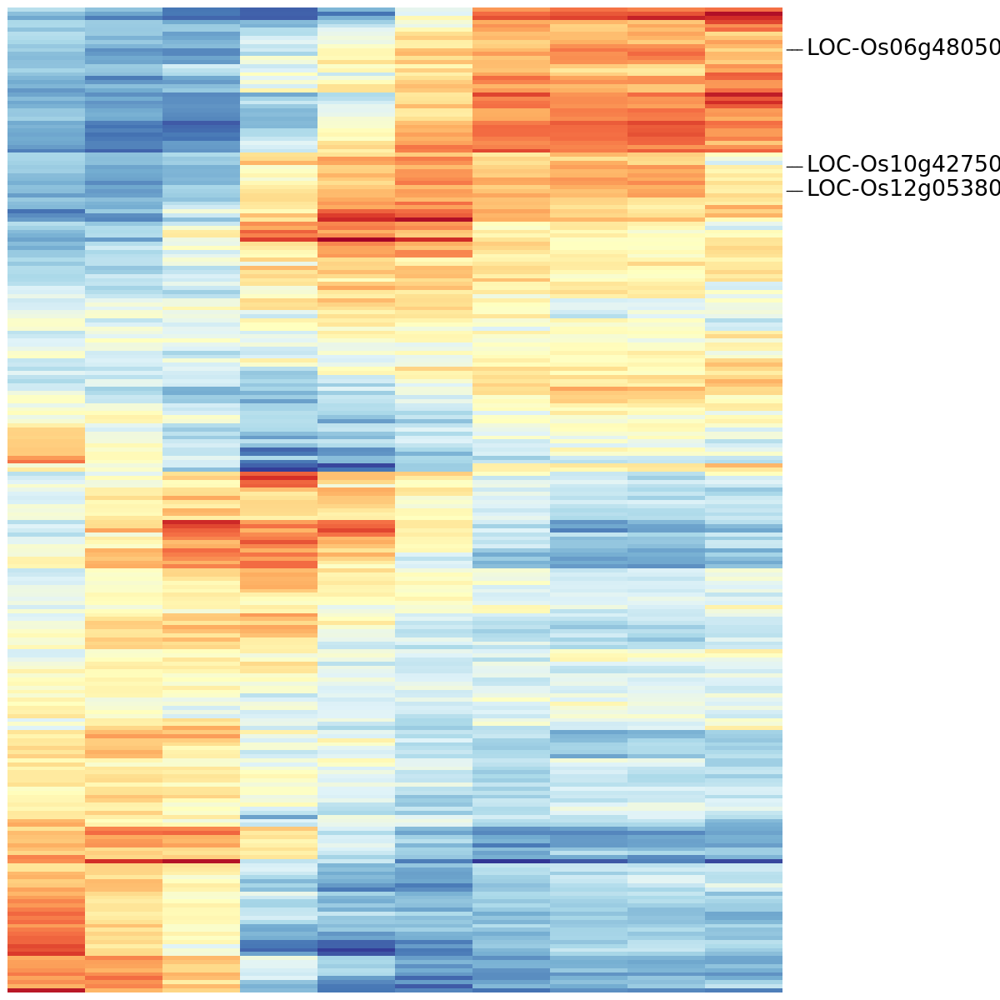

In [137]:
options(repr.plot.width=10, repr.plot.height=10)
draw(H)

In [58]:
head(agg_mat)

  [[ suppressing 10 column names ‘G0’, ‘G1’, ‘G2’ ... ]]



6 x 10 sparse Matrix of class "dgCMatrix"
                                                                             
Module 1 -0.1334537 -0.14754157 -0.3150538 -0.1767659 -0.07507645 -0.06467763
Module 2  0.2936735 -0.10560607 -0.3450147 -0.1036743 -0.10002747 -0.10695148
Module 3 -0.7208790 -0.69226044 -0.6460777 -0.2687351 -0.08150884  0.04492619
Module 4  0.2888668 -0.22825689 -0.4183544 -0.2137301 -0.14714879 -0.14648676
Module 5  0.2155738  0.26105565 -0.1678768 -0.1129208 -0.08103566 -0.20374199
Module 6  0.0003125  0.03490679 -0.2031616 -0.2008526 -0.08843608 -0.11795392
                                                     
Module 1  0.09255397 0.27402839 0.25791969 0.27657421
Module 2 -0.04251751 0.20883607 0.15246992 0.14687426
Module 3  0.39267546 0.64025783 0.76471404 0.56461802
Module 4  0.05865392 0.27764798 0.32958883 0.19516682
Module 5 -0.05882884 0.01707834 0.03861445 0.08444121
Module 6  0.04469907 0.19795312 0.15513694 0.17292993

In [110]:
order <- names(sort(apply(scale(agg_mat), MARGIN = 1, which.max)))

In [111]:
agg_mat <- scale(agg_mat)[order,]

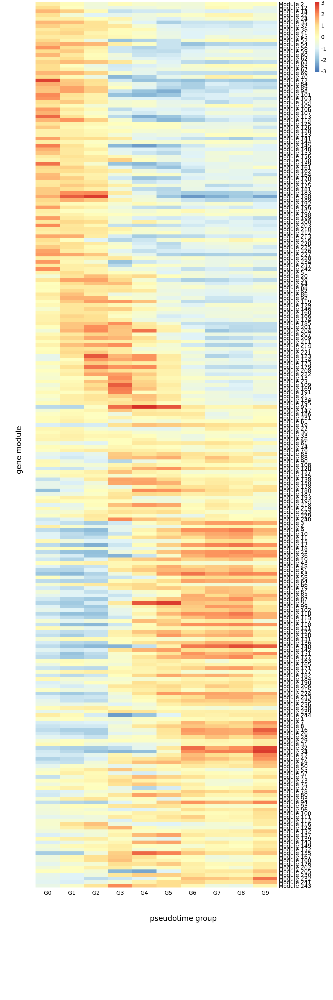

In [73]:
options(repr.plot.width=10, repr.plot.height=30)
setHook("grid.newpage", function() pushViewport(viewport(x=1,y=1,width=0.9, height=0.9, name="vp", just=c("right","top"))), action="prepend")
pheatmap::pheatmap(agg_mat, cluster_rows=FALSE, cluster_cols=FALSE,
                   scale="column", clustering_method="ward.D2",
                   fontsize=12)
setHook("grid.newpage", NULL, "replace")
grid.text("pseudotime group", y=-0.02, gp=grid::gpar(fontsize=16))
grid.text("gene module", x=-0.05, rot=90, gp=grid::gpar(fontsize=16))

In [33]:
## Specify one epdiermis marker gene and three trichoblast marker gene
target_genes <- c("LOC-Os12g05380", "LOC-Os10g42750", "LOC-Os06g48050")

In [35]:
for (i in target_genes){
    print(gene_module_df$module[which(gene_module_df$id==i)])
}


[1] 40
244 Levels: 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 ... 244
[1] 11
244 Levels: 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 ... 244
[1] 99
244 Levels: 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 ... 244


In [43]:
which(order == "Module 40")
which(order == "Module 11")
which(order == "Module 99")

[1] 154

[1] 148

[1] 167

In [21]:
head(gene_module_df)

id,module,supermodule,dim_1,dim_2
<chr>,<fct>,<fct>,<dbl>,<dbl>
LOC-Os01g01010,182,1,5.350191,12.300430
LOC-Os01g01030,67,1,-10.561002,1.902842
LOC-Os01g01040,75,1,-6.356702,-7.412914
LOC-Os01g01050,16,1,-3.345216,-2.505375
LOC-Os01g01060,203,1,-2.348689,3.785970
LOC-Os01g01070,10,1,7.493682,4.606720


In [22]:
head(cell_group_df)

cell,cell_group
<chr>,<chr>
AAACCCAAGTTGCTCA_1,G7
AAACCCAGTACGACTT_1,G7
AAACGAAAGCGTGCTC_1,G0
AAACGAACACCCAACG_1,G9
AAACGAAGTGTCCATA_1,G7
AAACGAATCTTCTGGC_1,G4


In [19]:
# Load ComplexHeatmap library
suppressMessages(library(ComplexHeatmap)) 

In [43]:
# Define a function to label specific genes on the heatmap
label_genes <- c("LOC-Os12g05380", "LOC-Os10g42750", "LOC-Os06g48050")

draw_colnames_with_labels <- function (coln, gaps, label_genes, ...) {
  coord <- pheatmap:::find_coordinates(length(coln), gaps)
  x <- coord$coord - 0.5 * coord$size
  res <- grid::textGrob(
    coln, x = x, y = unit(1, "npc") - unit(3, "bigpts"),
    vjust = 1.5, hjust = 0.5, rot = 0, gp = grid::gpar(...)
  )
  
  # Label specific genes on the right side
  label_indices <- which(coln %in% label_genes)
  res_label <- grid::textGrob(
    label_genes, x = rep(max(x) + 1, length(label_genes)),
    y = unit(1, "npc") - unit(3, "bigpts") - coord$size[label_indices] * seq_along(label_genes),
    vjust = 1.5, hjust = 0, rot = 0, gp = grid::gpar(...)
  )
  
  return(grid::gList(res, res_label))
}

# Assign the new function to the pheatmap namespace
assignInNamespace(
  x = "draw_colnames",
  value = "draw_colnames_with_labels",
  ns = asNamespace("pheatmap")
)

# Generate the heatmap with labeled genes
pheatmap::pheatmap(agg_mat, cluster_rows = TRUE, cluster_cols = FALSE,
                   scale = "column", clustering_method = "ward.D2",
                   fontsize = 12, labels_row = rep("", length(unique(gene_module_df$module))),
                   draw_colnames = TRUE, label_genes = label_genes)

# Additional formatting
setHook("grid.newpage", NULL, "replace")
grid.text("pseudotime group", y = -0.02, gp = grid::gpar(fontsize = 16))
grid.text("gene module", x = -0.05, rot = 90, gp = grid::gpar(fontsize = 16))


ERROR: Error in as.unit(e2): object is not coercible to a unit


In [37]:
# Genes to label on the right side
label_genes <- c("LOC-Os12g05380", "LOC-Os10g42750", "LOC-Os06g48050")

# Convert agg_mat to a data frame
agg_mat_df <- as.data.frame(agg_mat)
agg_mat_df$gene <- rownames(agg_mat_df)

# Create a ggplot object
heatmap_plot <- ggplot(data = agg_mat_df, aes(x = colnames(agg_mat_df), y = gene)) +
  geom_tile(aes(fill = agg_mat_df[[1]]), color = "white") +  # Assuming the first column represents values
  scale_fill_gradient(low = "blue", high = "red") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5),
        axis.text.y = element_text(size = 8),
        legend.position = "none") +
  labs(title = "Gene Expression Heatmap",
       x = "Gene",
       y = "Module")

# Label specific genes on the right side
label_df <- data.frame(x = rep(length(colnames(agg_mat_df)) + 1, length(label_genes)),
                       y = seq_along(label_genes),
                       label = label_genes)

heatmap_plot +
  geom_text(data = label_df, aes(x = x, y = y, label = label), vjust = 1, hjust = 0) +
  theme(plot.margin = margin(0.5, 0.5, 0.5, 5, "cm"))  # Adjust the right margin for gene labels


ERROR while rich displaying an object: Error in `geom_tile()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `check_aesthetics()`:
! Aesthetics must be either length 1 or the same as the data (245)
✖ Fix the following mappings: `x`

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr

Error in pushViewport(viewport(x = 1, y = 1, width = 0.9, height = 0.9,  : 
  could not find function "pushViewport"
Error in pushViewport(viewport(x = 1, y = 1, width = 0.9, height = 0.9,  : 
  could not find function "pushViewport"
Error in pushViewport(viewport(x = 1, y = 1, width = 0.9, height = 0.9,  : 
  could not find function "pushViewport"
Error in pushViewport(viewport(x = 1, y = 1, width = 0.9, height = 0.9,  : 
  could not find function "pushViewport"
Error in pushViewport(viewport(x = 1, y = 1, width = 0.9, height = 0.9,  : 
  could not find function "pushViewport"
Error in pushViewport(viewport(x = 1, y = 1, width = 0.9, height = 0.9,  : 
  could not find function "pushViewport"
Error in pushViewport(viewport(x = 1, y = 1, width = 0.9, height = 0.9,  : 
  could not find function "pushViewport"
Error in pushViewport(viewport(x = 1, y = 1, width = 0.9, height = 0.9,  : 
  could not find function "pushViewport"


## Draw the final dim plots for figures

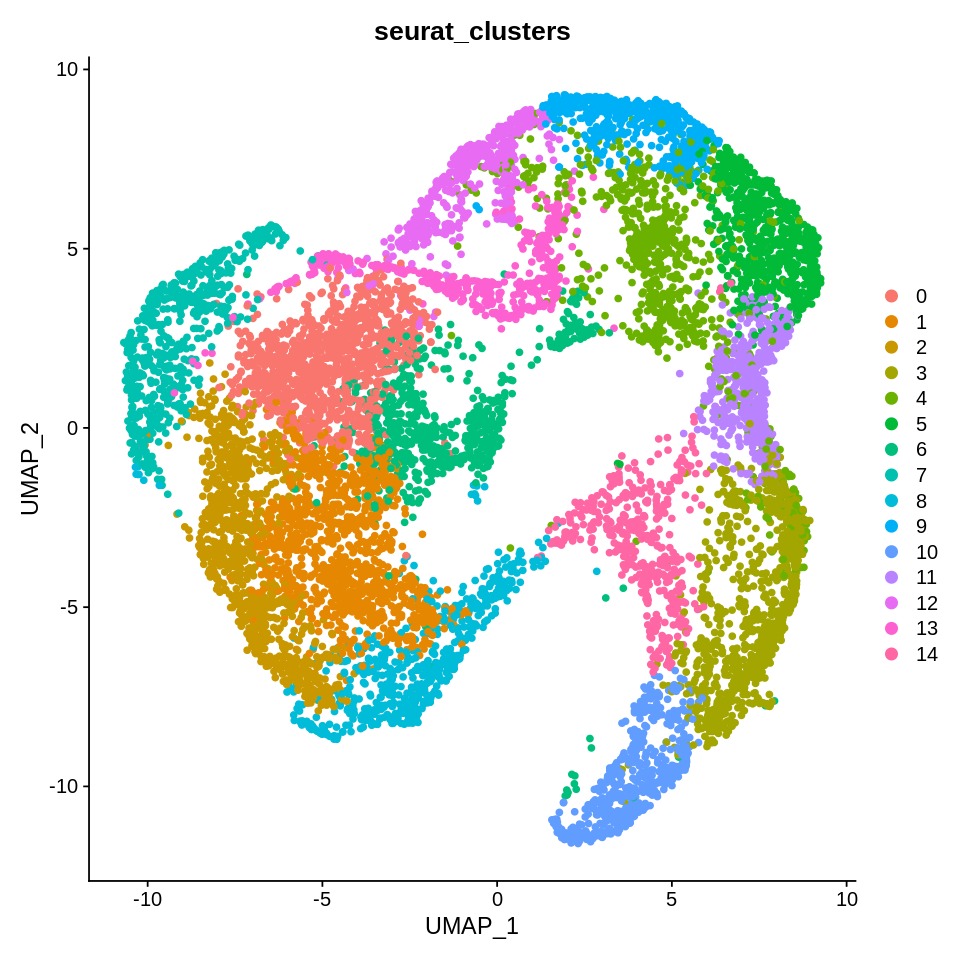

In [62]:
# Dimplot1
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(sub.epidermis2, reduction = "umap",label = FALSE,group.by = "seurat_clusters", pt.size = 1.5)

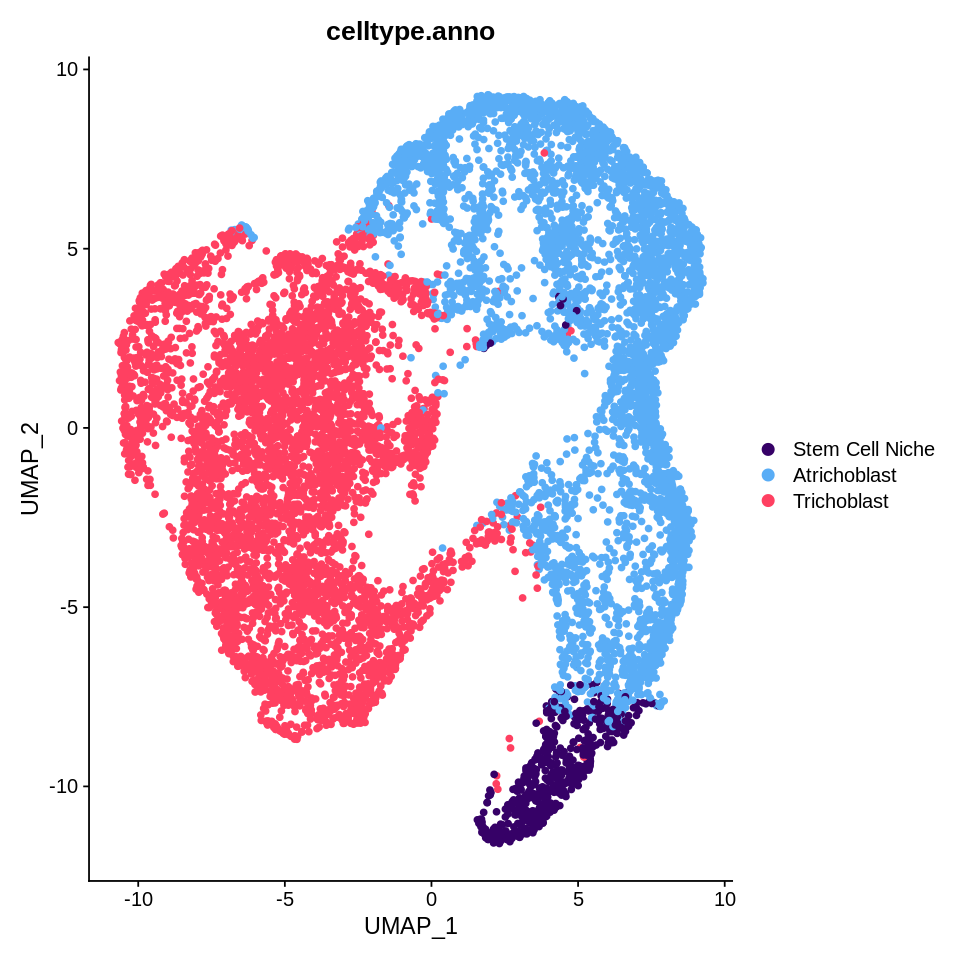

In [5]:
# Dimplot2
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(sub.epidermis2, reduction = "umap",label = FALSE,group.by = "celltype.anno", cols = c("#360167", "#59adf6", "#Ff4061"),pt.size = 1.5)

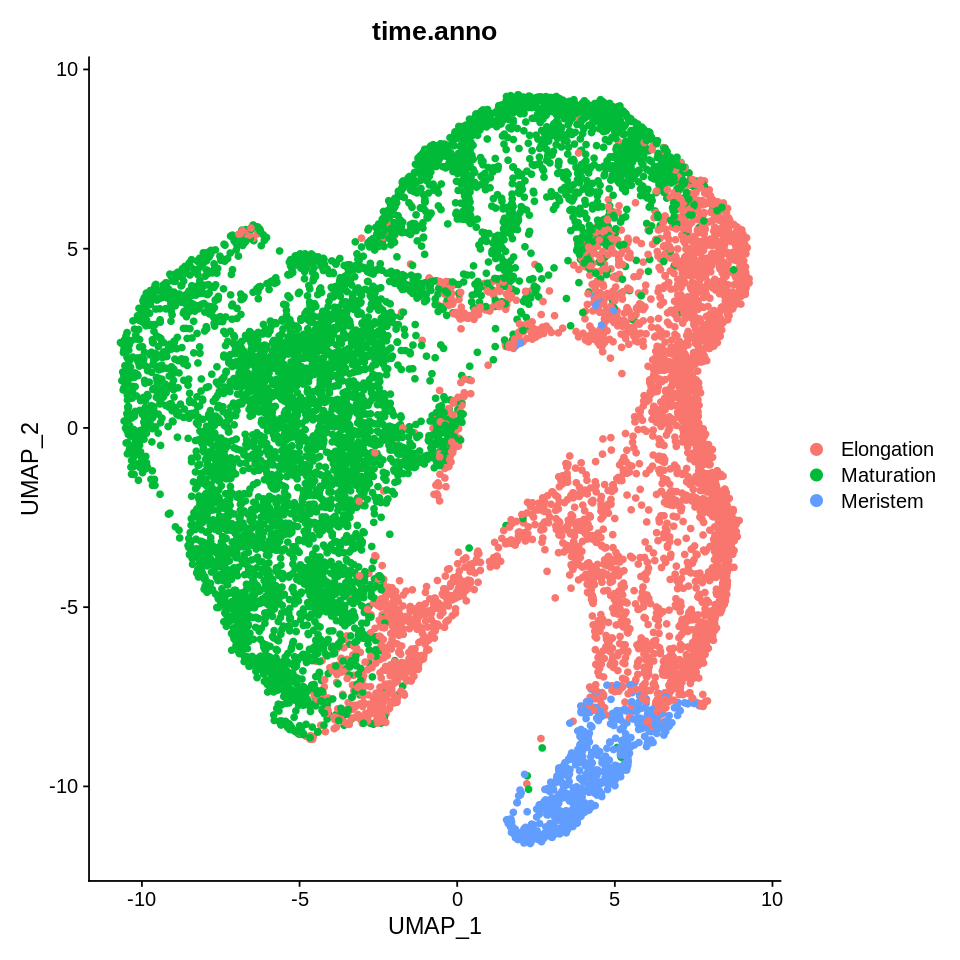

In [68]:
# Dimplot3
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(sub.epidermis2, reduction = "umap",label = FALSE,group.by = "time.anno", cols = c("red", "grey", "blue"),pt.size = 1.5)

In [61]:
sessionInfo()

R version 4.3.1 (2023-06-16)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Stream 8

Matrix products: default
BLAS/LAPACK: /hpc/group/pbenfeylab/mz187/miniconda3/envs/mon3/lib/libopenblasp-r0.3.23.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/New_York
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] RColorBrewer_1.1-3          ggplot2_3.4.3              
 [3] monocle3_1.0.0              SingleCellExperiment_1.22.0
 [5] SummarizedExperiment_1.30.2 GenomicRanges_1.52.0       
 [7] GenomeInf